In [1]:
!pip install pyroomacoustics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 44.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pybind11-2.10.4-py3-none-any.whl (222 kB)
  Created wheel for pyroomacoustics: filename=pyroomacoustics-0.7.3-cp310-cp310-linux_x86_64.whl size=12136408 sha256=683be0d4c6a0325d201759780ee9369cf09d045e328837cb0d47c4faaf2333f3
  Stored in directory: /root/.cache/pip/wheels/6b/f3/67/0d0c4c06234c59c14e5ccf72774bd5c5f1b43c3083043c7fb7
Successfully built pyroomacoustics


In [2]:
!pip install sounddevice

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!sudo apt-get install libportaudio2

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  libportaudio2
0 upgraded, 1 newly installed, 0 to remove and 24 not upgraded.
Need to get 65.4 kB of archives.
After this operation, 223 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 libportaudio2 amd64 19.6.0-1build1 [65.4 kB]
Fetched 65.4 kB in 0s (431 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package libportaudio2:amd64.
(Reading database ... 122518 

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import pyroomacoustics as pra
import sounddevice as snd
import argparse
from scipy.io import wavfile
import os
import csv

**Arctic dataset**

Download http://festvox.org/cmu_arctic/packed/cmu_us_bdl_arctic.tar.bz2 into ./CMU_ARCTIC ...
The dataset contains 1131 samples.
Metadata attributes are:
  speaker (1) :
      * bdl occurs 1131 times
  tag (1131) :
      * a0001 occurs 1 times
      * a0002 occurs 1 times
      * a0003 occurs 1 times
      ...
      * a0004 occurs 1 times
      * a0005 occurs 1 times
      * a0006 occurs 1 times
  text (1131) :
      * Author of the danger trail, Philip Steels, etc. occurs 1 times
      * Not at this particular case, Tom, apologized Whittemore. occurs 1 times
      * For the twentieth time that evening the two men shook hands. occurs 1 times
      ...
      * Lord, but I'm glad to see you again, Phil. occurs 1 times
      * Will we ever forget it. occurs 1 times
      * God bless 'em, I hope I'll go on seeing them forever. occurs 1 times
  sex (1) :
      * male occurs 1131 times
  lang (1) :
      * US English occurs 1131 times
  accent (1) :
      * US occurs 1131 times
The first 10 

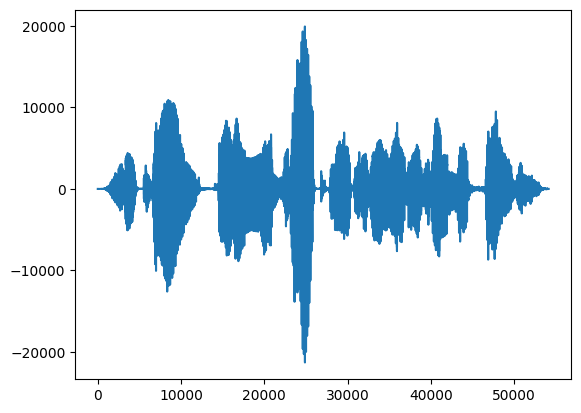

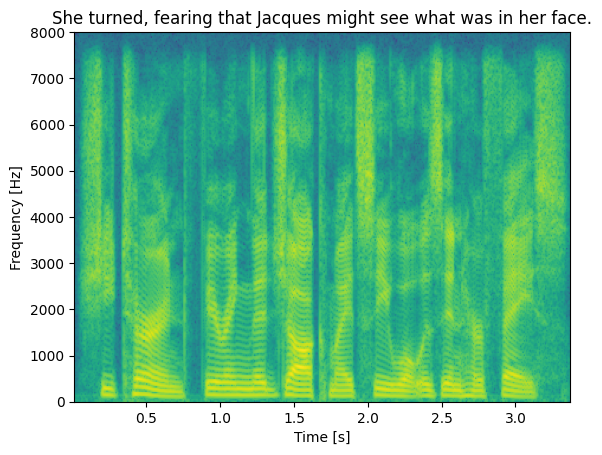

In [5]:
# Here, the corpus for speaker bdl is automatically downloaded
# if it is not available already
corpus = pra.datasets.CMUArcticCorpus(download=True, speaker=['bdl'])

# print dataset info and 10 sentences
print(corpus)
corpus.head(n=10)

# let's extract all samples containing the word 'what'
keyword = 'what'
matches = corpus.filter(text=lambda t : keyword in t)
print('The number of sentences containing "{}": {}'.format(keyword, len(matches)))
for s in matches.sentences:
    print('  *', s)

# if the sounddevice package is available, we can play the sample
#matches[1].play()

audio_signal = matches[1]
audio_signal_samples = audio_signal.data
audio_signal_size = len(audio_signal_samples)

print("\nLength(number of samples) of audio signal: %d" % audio_signal_size)
print("Audio signal sampling frequency: %d" % audio_signal.fs)
print("Type of audio signal representation: %s" % (type(audio_signal)))
print("Audio signal in time domain: ")
plt.plot(np.arange(0, audio_signal_size), audio_signal.data)


# show the spectrogram
plt.figure()
audio_signal.plot()
plt.show()

**Google Speech Commands dataset**

In [6]:
google_speech_dataset = pra.datasets.GoogleSpeechCommands(download=True, subset=10, seed=0)

/usr/local/lib/python3.10/dist-packages/pyroomacoustics/datasets/google_speech_commands.py:199: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, data = wavfile.read(path)


The dataset contains 306 samples.
Metadata attributes are:
  word (31) :
      * five occurs 10 times
      * seven occurs 10 times
      * stop occurs 10 times
      ...
      * two occurs 10 times
      * one occurs 10 times
      * sheila occurs 10 times
  speech (2) :
      * True occurs 300 times
      * False occurs 6 times
  file_loc (306) :
      * ./google_speech_commands/five/8601f33b_nohash_0.wav occurs 1 times
      * ./google_speech_commands/five/fac7deca_nohash_0.wav occurs 1 times
      * ./google_speech_commands/five/6736bc64_nohash_0.wav occurs 1 times
      ...
      * ./google_speech_commands/five/0474c92a_nohash_0.wav occurs 1 times
      * ./google_speech_commands/five/bab36420_nohash_0.wav occurs 1 times
      * ./google_speech_commands/five/95ba4996_nohash_2.wav occurs 1 times
  noise_type (6) :
      * exercise_bike occurs 1 times
      * white_noise occurs 1 times
      * dude_miaowing occurs 1 times
      * doing_the_dishes occurs 1 times
      * pink_noise oc

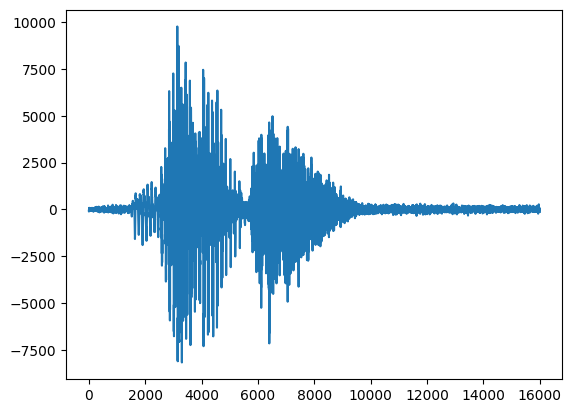

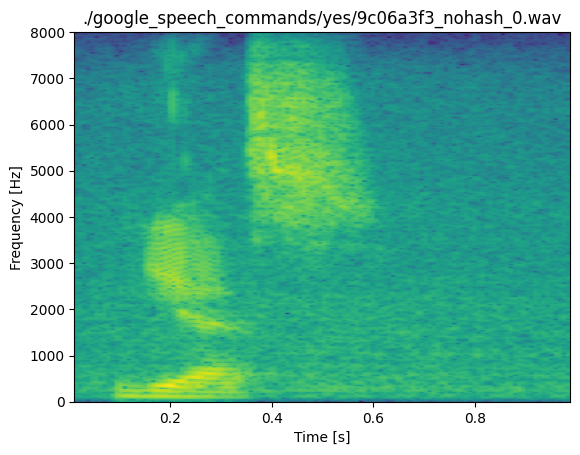

In [7]:
# print dataset info, first 10 entries, and all sounds
print(google_speech_dataset)
google_speech_dataset.head(n=10)
print("All sounds in the google_speech_dataset:")
print(google_speech_dataset.classes)

# filter by specific word
selected_word = 'yes'
matches = google_speech_dataset.filter(word=selected_word)
print("Number of '%s' samples : %d" % (selected_word, len(matches)))

# if the sounddevice package is available, we can play the sample
#matches[0].play()

audio_signal = matches[0]
audio_signal_samples = audio_signal.data
audio_signal_size = len(audio_signal_samples)

print("Length(number of samples) of audio signal: %d" % audio_signal_size)
print("Audio signal sampling frequency: %d" % audio_signal.fs)
print("Type of audio signal representation: %s" % (type(audio_signal)))
print("Audio signal in time domain: ")
plt.plot(np.arange(0, audio_signal_size), audio_signal.data)

# show the spectrogram
plt.figure()
audio_signal.plot()
plt.show()

**Generating RIR dataset from 'yes' word recordings from Google Speech Commands Dataset.**

In [8]:
def gen_rect_coords_by_polar_coords(angles, distances):
    points_x_coords = np.outer(distances.reshape(distances.shape[0], 1), np.cos(angles.reshape(1, angles.shape[0])))
    points_y_coords = np.outer(distances.reshape(distances.shape[0], 1), np.sin(angles.reshape(1, angles.shape[0])))
    points_x_coords = points_x_coords.reshape(-1)
    points_y_coords = points_y_coords.reshape(-1)
    return points_x_coords.reshape(-1),  points_y_coords.reshape(-1)

In [9]:
def gen_2d_points_by_polar_coords(angles, distances):
  points_x_coords = np.outer(distances.reshape(distances.shape[0], 1), np.cos(angles.reshape(1, angles.shape[0])))
  points_y_coords = np.outer(distances.reshape(distances.shape[0], 1), np.sin(angles.reshape(1, angles.shape[0])))
  points_x_coords, points_y_coords = gen_rect_coords_by_polar_coords(angles, distances)
  return np.column_stack((points_x_coords, points_y_coords))
  #print(points_x_coords)
  #print(points_y_coords)

In [10]:
def get_angle_and_distance_by_2d_point_index(point_index, angles, distances):
  return angles[point_index % len(angles)], distances[point_index // len(angles)]

In [11]:
def write_dict_to_csv(d, file_path):
  keys = sorted(d.keys())
  with open(file_path, "w") as outfile:
    writer = csv.writer(outfile, delimiter = ",")
    writer.writerow(keys)
    writer.writerows(zip(*[d[key] for key in keys]))


In [12]:
def get_hash_from_google_command_audio_file_name(file_name):
  return file_name[0:8]

['59c3a7f2_nohash_0.wav', 'aff582a1_nohash_3.wav', '42e3f068_nohash_0.wav', 'b3bb4dd6_nohash_0.wav', 'd37e4bf1_nohash_0.wav', 'f9273a21_nohash_0.wav', '4845bb10_nohash_0.wav', '9229bff9_nohash_0.wav', 'e71b4ce6_nohash_0.wav', 'f19c1390_nohash_4.wav', '8931f494_nohash_1.wav', '520e8c0e_nohash_0.wav', '325a0c39_nohash_0.wav', '11b1df78_nohash_2.wav', '215699ff_nohash_0.wav', '3b8406c0_nohash_1.wav', '229978fd_nohash_0.wav', '2f813234_nohash_0.wav', 'df1d5024_nohash_2.wav', '1eddce1d_nohash_1.wav', 'c103a2d5_nohash_1.wav', '9b6c08ba_nohash_1.wav', '708b8d51_nohash_1.wav', '6272b231_nohash_0.wav', '152491bc_nohash_0.wav', 'b83c1acf_nohash_3.wav', '140a0fdc_nohash_1.wav', '439c84f4_nohash_3.wav', '918a2473_nohash_3.wav', 'e53139ad_nohash_2.wav', 'c38720cb_nohash_0.wav', 'dea820ce_nohash_2.wav', '3f339c33_nohash_0.wav', '11b1df78_nohash_0.wav', 'c9b653a0_nohash_4.wav', 'b9f46737_nohash_3.wav', 'f19c1390_nohash_2.wav', '130d9a87_nohash_0.wav', '106a6183_nohash_0.wav', '324210dd_nohash_0.wav',

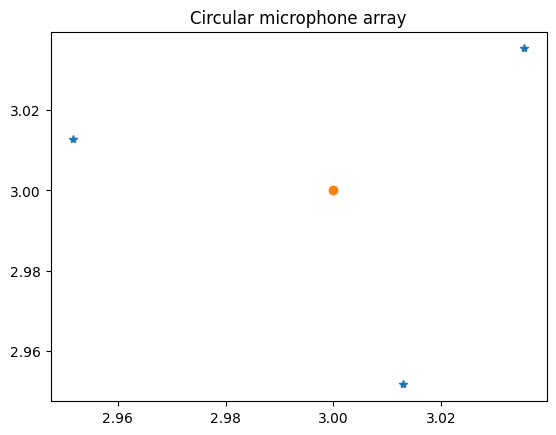

In [25]:
yes_speech_com_audio_files_dir_path = "/content/google_speech_commands/yes/"
yes_speech_com_audio_files_pathes = os.listdir(yes_speech_com_audio_files_dir_path)

sound_localization_data_set_path = "/content/drive/MyDrive/diploma_sound_localization_data/"
sources_params_file_name = "sources_params.csv"
mics_params_file_name = "microphones_params.csv"

print(yes_speech_com_audio_files_pathes)
print("Total amount 'yes' word audio recodings: %d" % len(yes_speech_com_audio_files_pathes))

fs = 16000

room_dim = [6, 6]
room_center = [dim / 2 for dim in room_dim] 

audio_sources_angle_delta = 45
audio_sources_angles_num = int(360 / audio_sources_angle_delta)
audio_sources_angles = np.linspace(0, ((audio_sources_angles_num - 1) / (audio_sources_angles_num / 2)) * np.pi, audio_sources_angles_num)
audio_sources_distances = np.array([2])

# obtain 2D coordinates for each audio source location point
points_x_coords, points_y_coords = gen_rect_coords_by_polar_coords(audio_sources_angles, audio_sources_distances)

# define the locations of the audio sources
audio_sources_loc_points = gen_2d_points_by_polar_coords(audio_sources_angles, audio_sources_distances) + np.array(room_center).reshape(1, 2)

microphones_num = 3
inter_microphone_distance = 0.05

# define the locations of the microphones
mics_locs = pra.beamforming.circular_2D_array(room_center, microphones_num,np.pi / 4, 0.05)

# The desired reverberation time
rt60 = 0.5  # seconds

# High, medium and low SNRs
SNRs = [60, 30, 10]

mics_params = {"m_num": [i for i in range(microphones_num)],
                      "x": (mics_locs[0]).tolist(),
                      "y": (mics_locs[1]).tolist()}
sources_params = {"s_num": [i for i in range(len(audio_sources_angles) * len(audio_sources_distances))], 
                  "x": points_x_coords.tolist(),
                  "y": points_y_coords.tolist(),
                  "angle": audio_sources_angles.tolist() * len(audio_sources_distances),
                  "distance": (np.repeat(audio_sources_distances, len(audio_sources_angles))).tolist()}

write_dict_to_csv(sources_params, f"{sound_localization_data_set_path}{sources_params_file_name}")
write_dict_to_csv(mics_params, f"{sound_localization_data_set_path}{mics_params_file_name}")

plt.title("Circular microphone array")
plt.plot(mics_locs[0], mics_locs[1], "*")
plt.plot(room_center[0], room_center[1], "o")

The desired RT60 was 2.0
The measured RT60 is 2.4174375
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


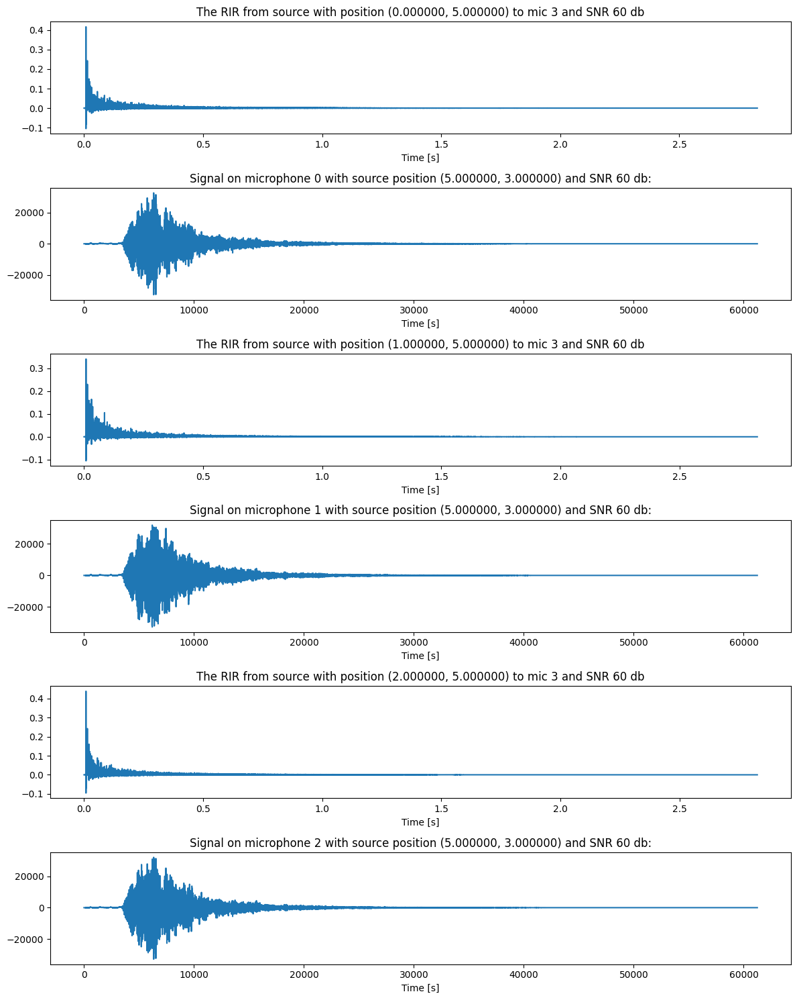

The desired RT60 was 2.0
The measured RT60 is 2.4174375
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


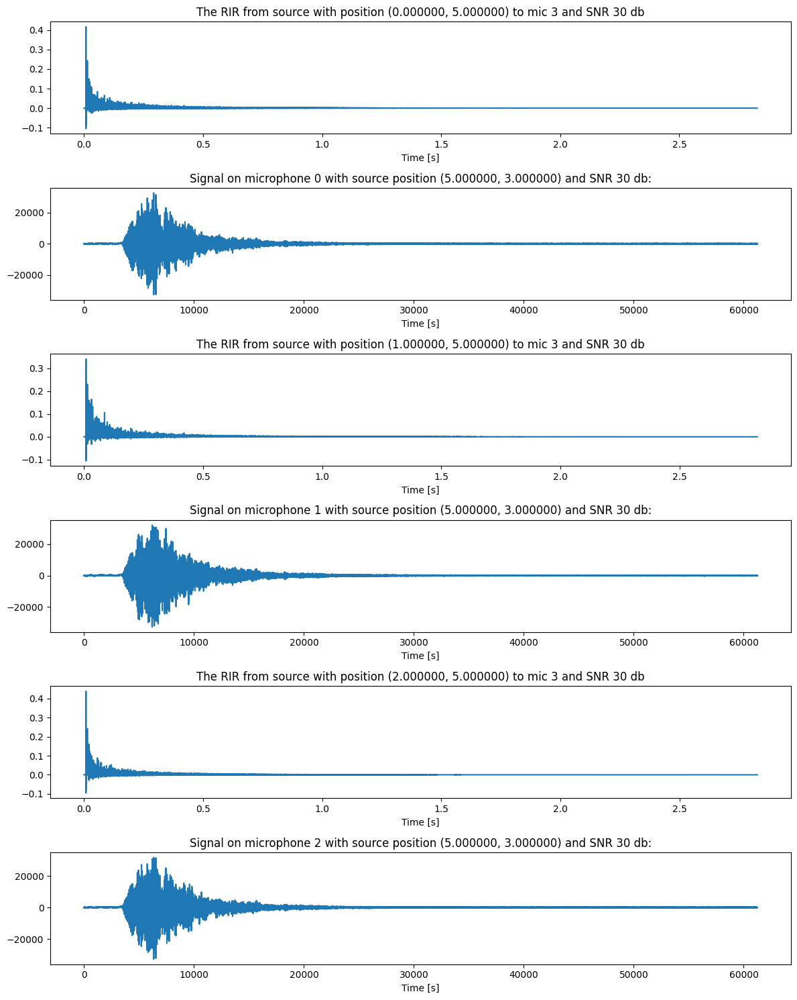

The desired RT60 was 2.0
The measured RT60 is 2.4174375
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


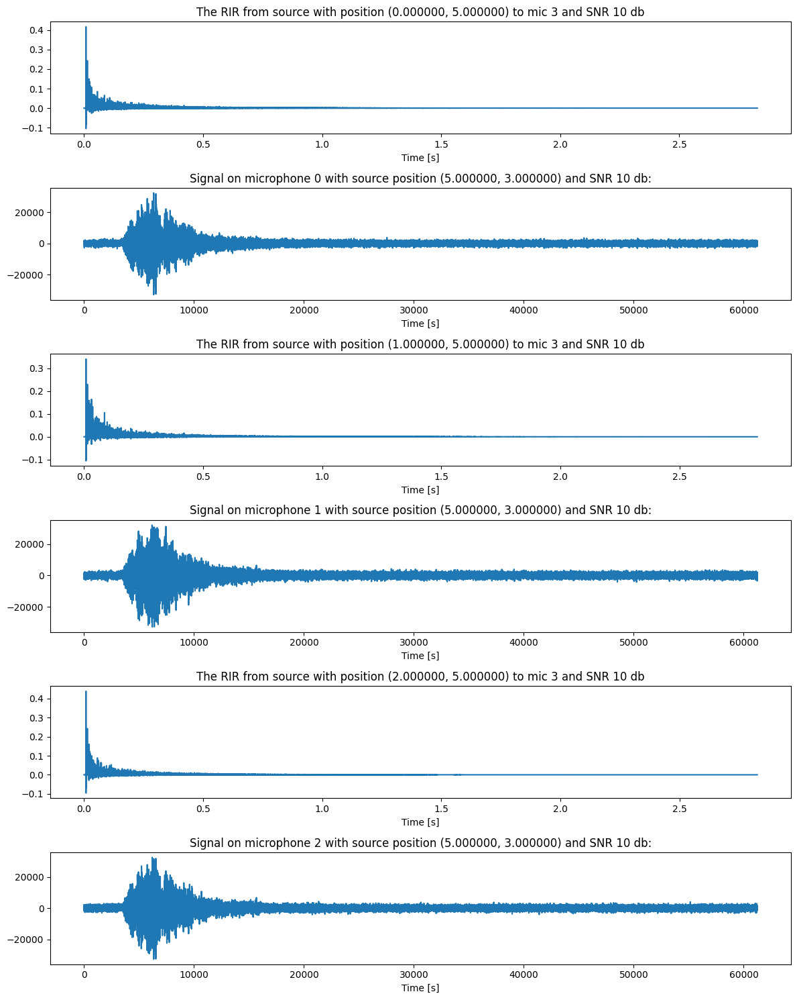

The desired RT60 was 2.0
The measured RT60 is 2.4208125
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


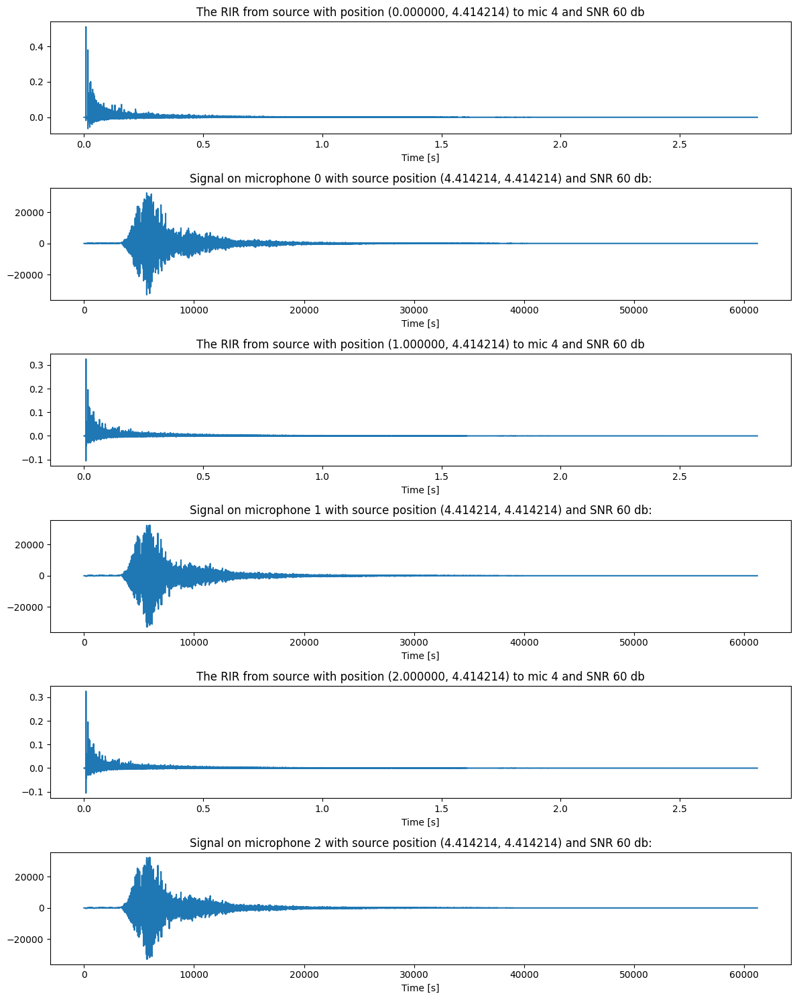

The desired RT60 was 2.0
The measured RT60 is 2.4208125
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


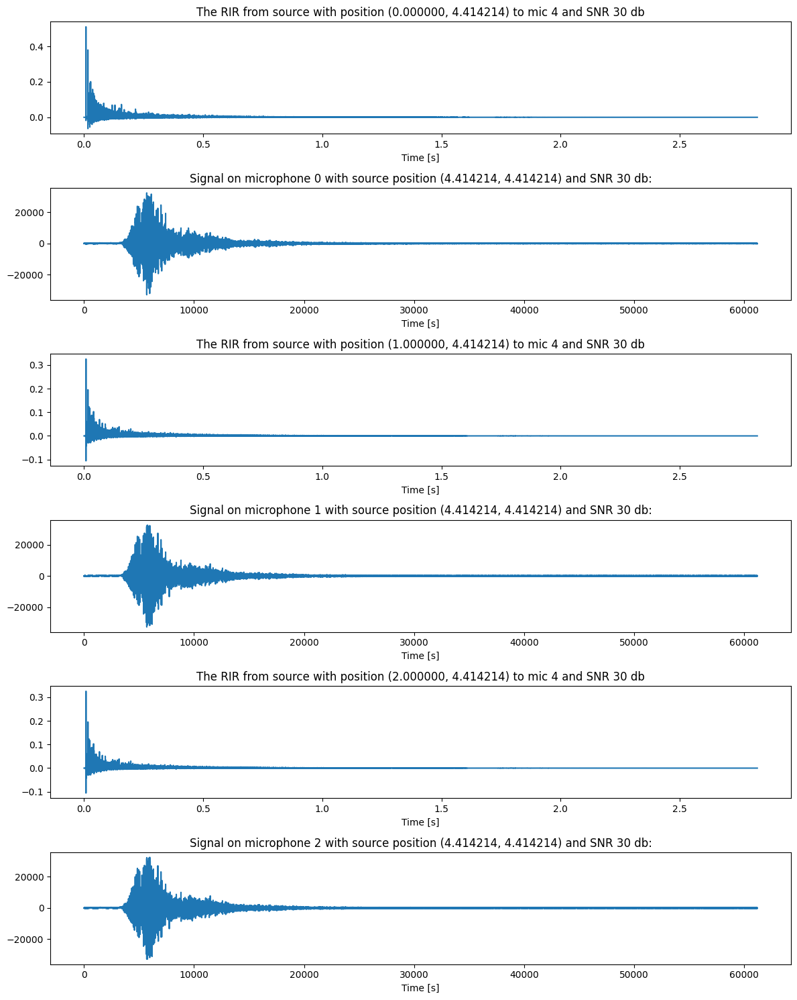

The desired RT60 was 2.0
The measured RT60 is 2.4208125
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


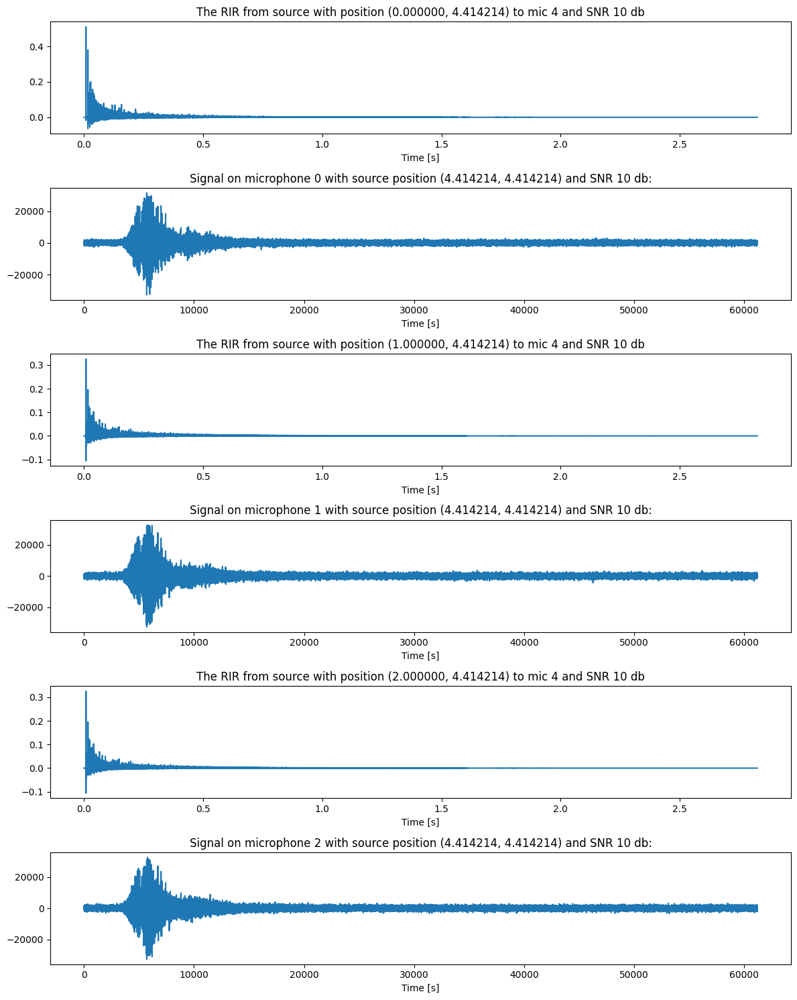

The desired RT60 was 2.0
The measured RT60 is 2.4411875
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


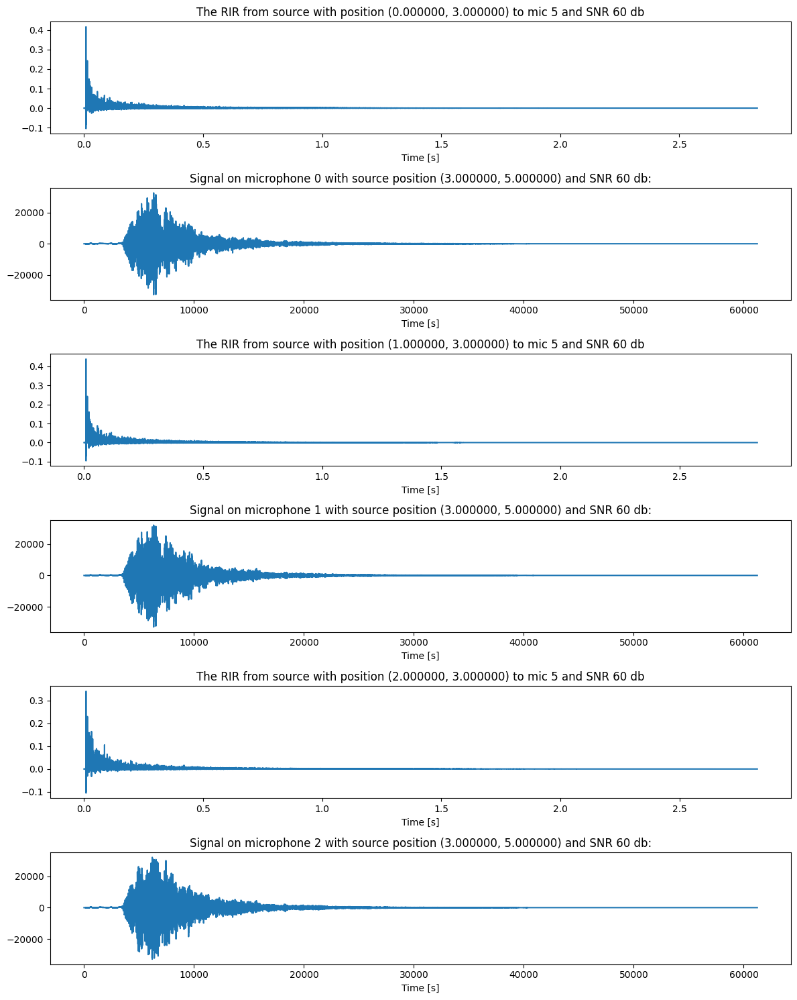

The desired RT60 was 2.0
The measured RT60 is 2.4411875
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


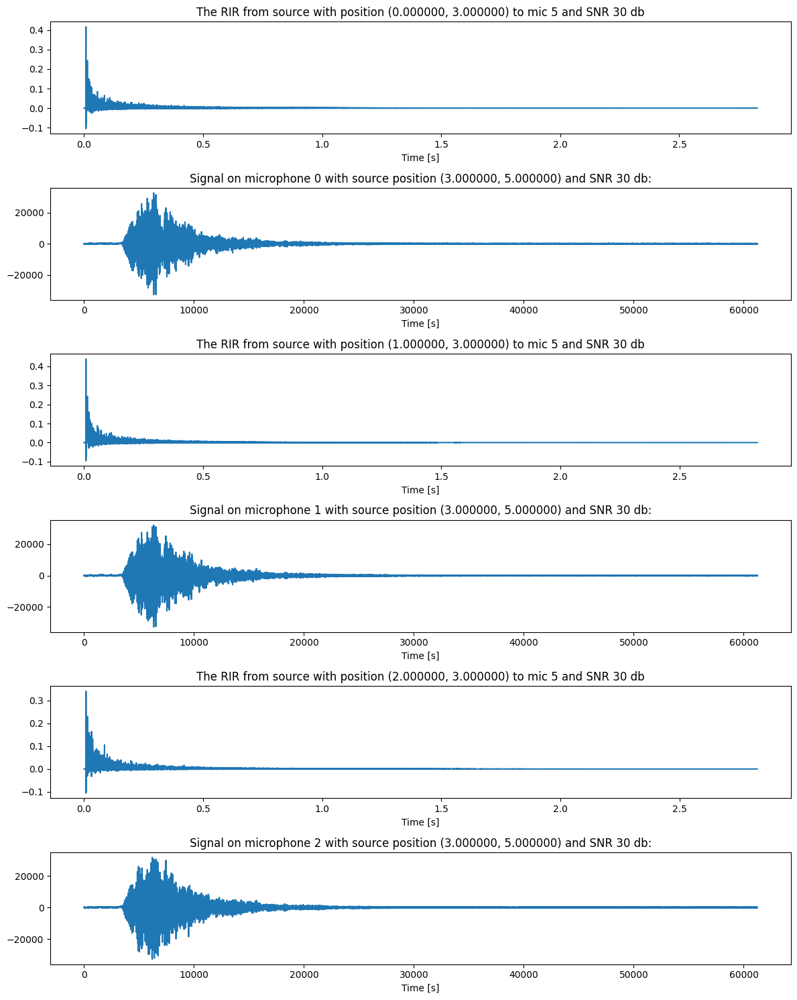

The desired RT60 was 2.0
The measured RT60 is 2.4411875
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


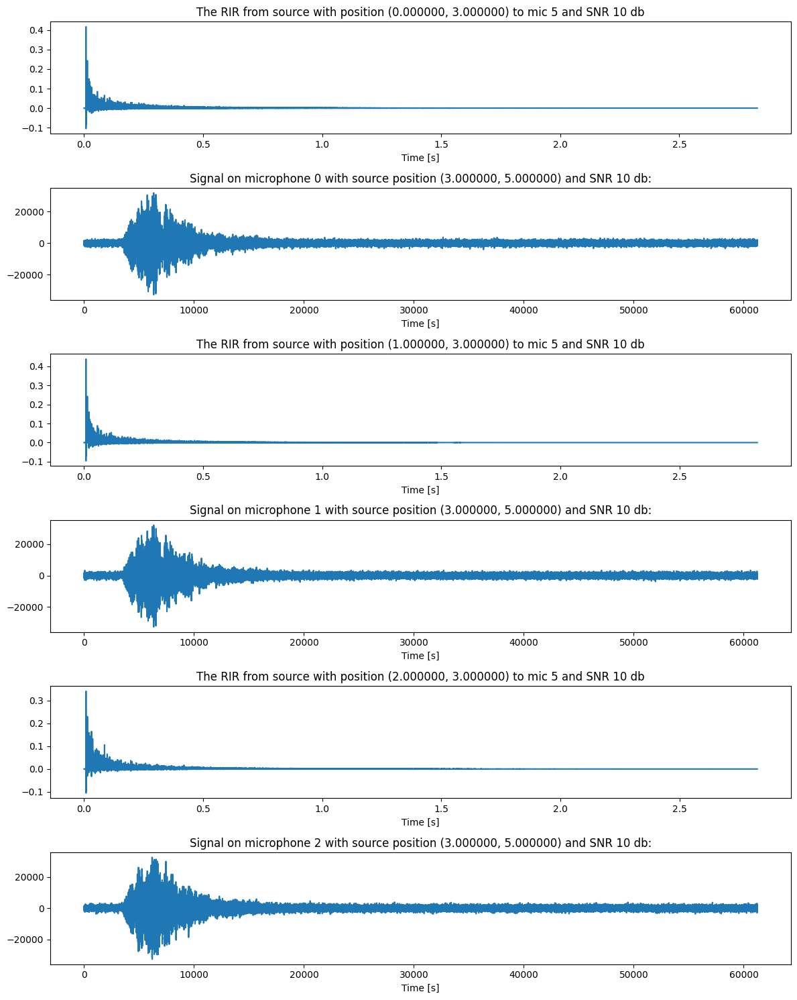

The desired RT60 was 2.0
The measured RT60 is 2.395
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


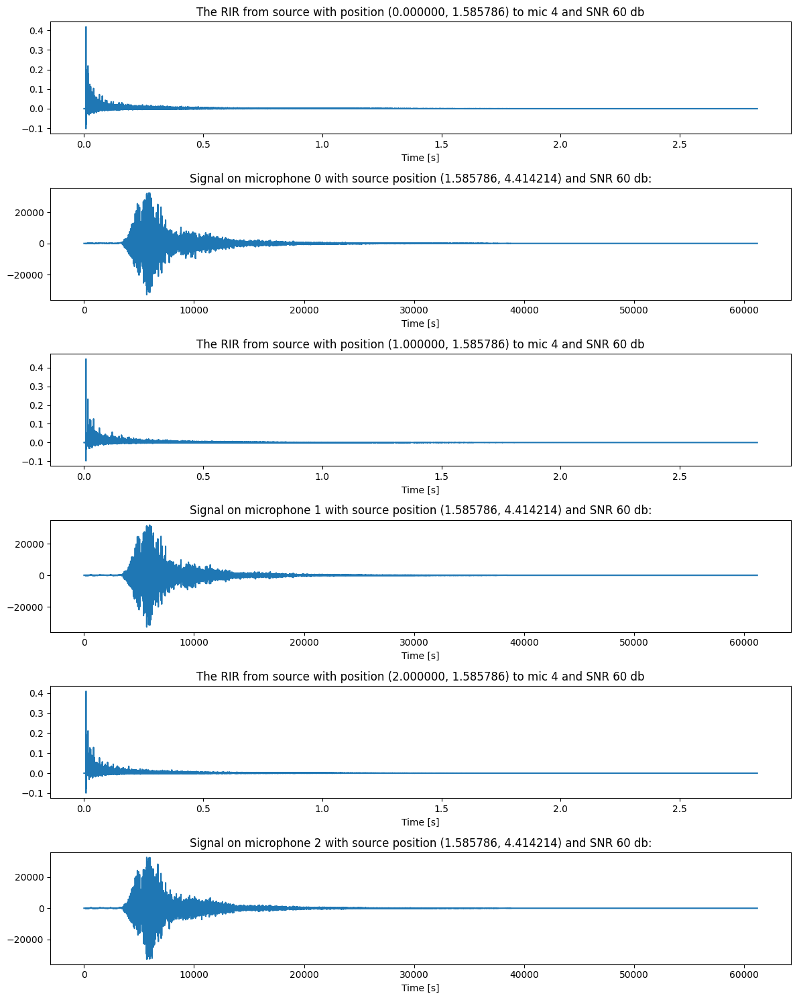

The desired RT60 was 2.0
The measured RT60 is 2.395
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


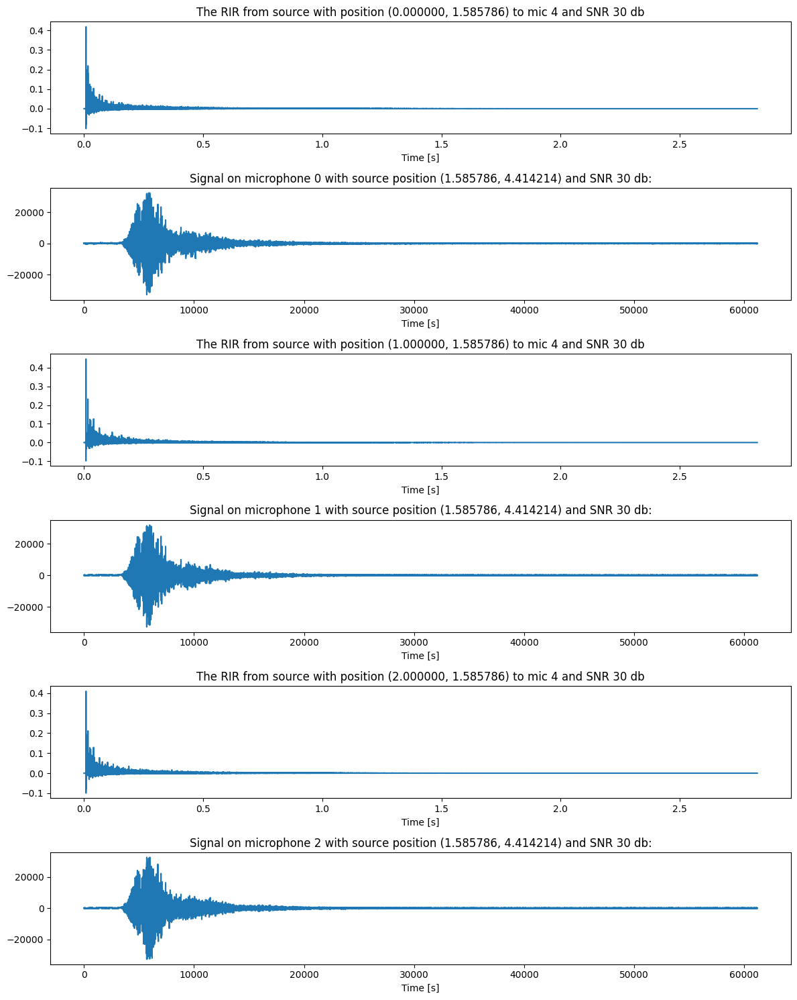

The desired RT60 was 2.0
The measured RT60 is 2.395
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


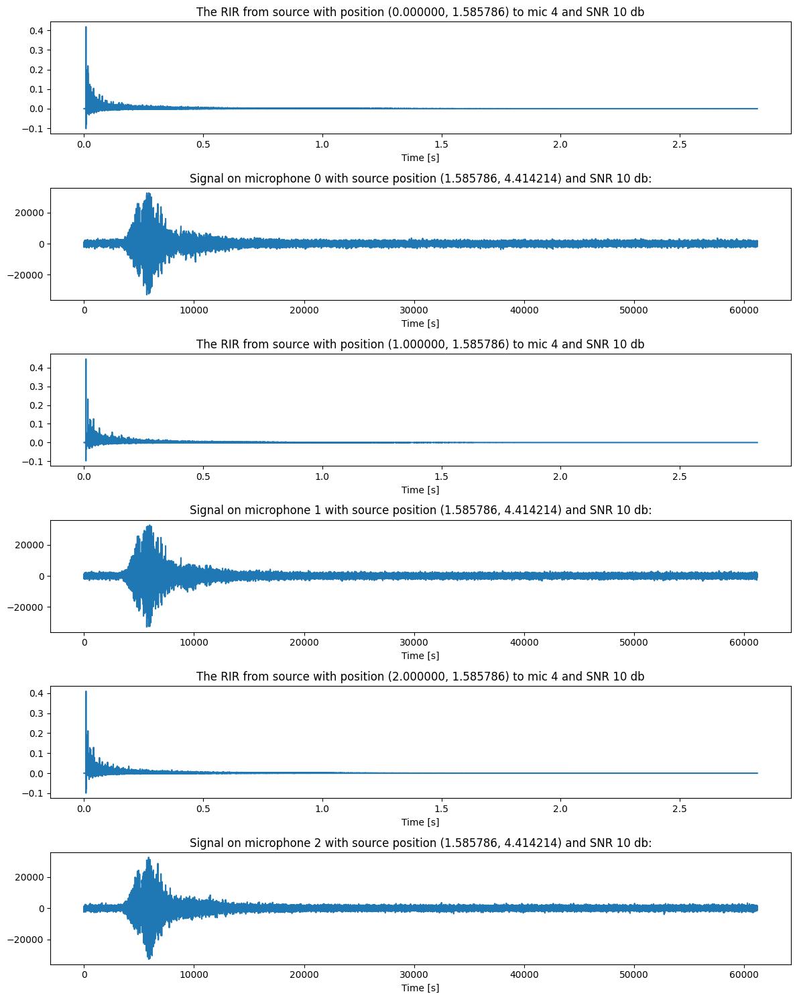

The desired RT60 was 2.0
The measured RT60 is 2.415375
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


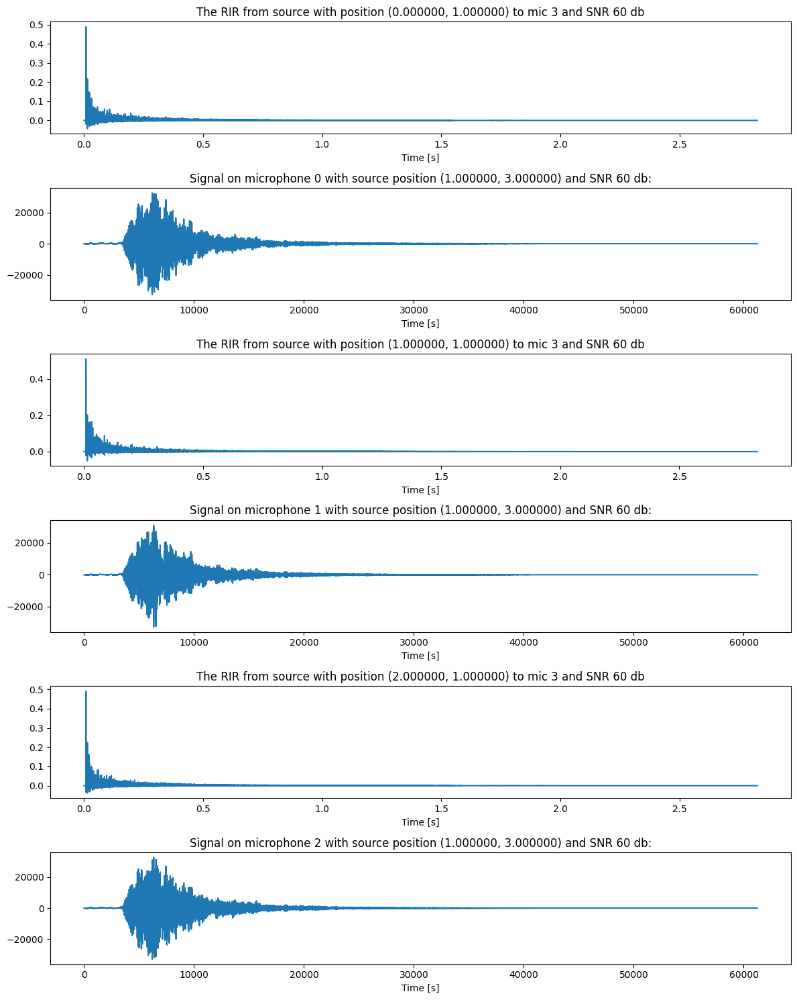

The desired RT60 was 2.0
The measured RT60 is 2.415375
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


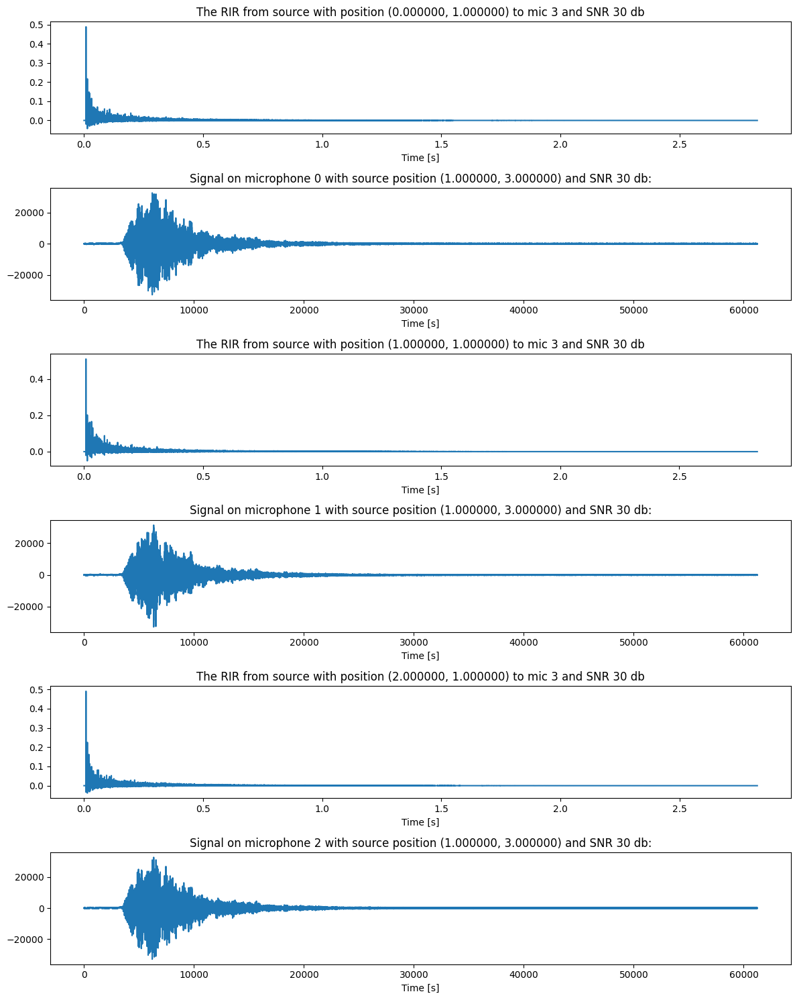

The desired RT60 was 2.0
The measured RT60 is 2.415375
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


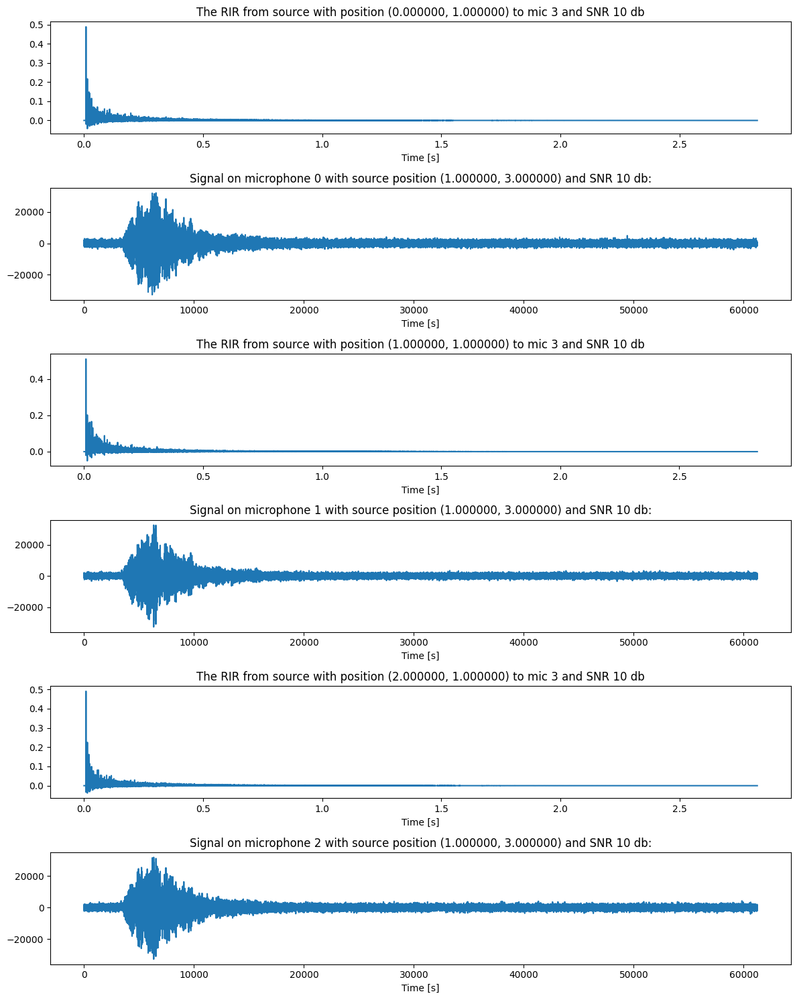

The desired RT60 was 2.0
The measured RT60 is 2.419
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


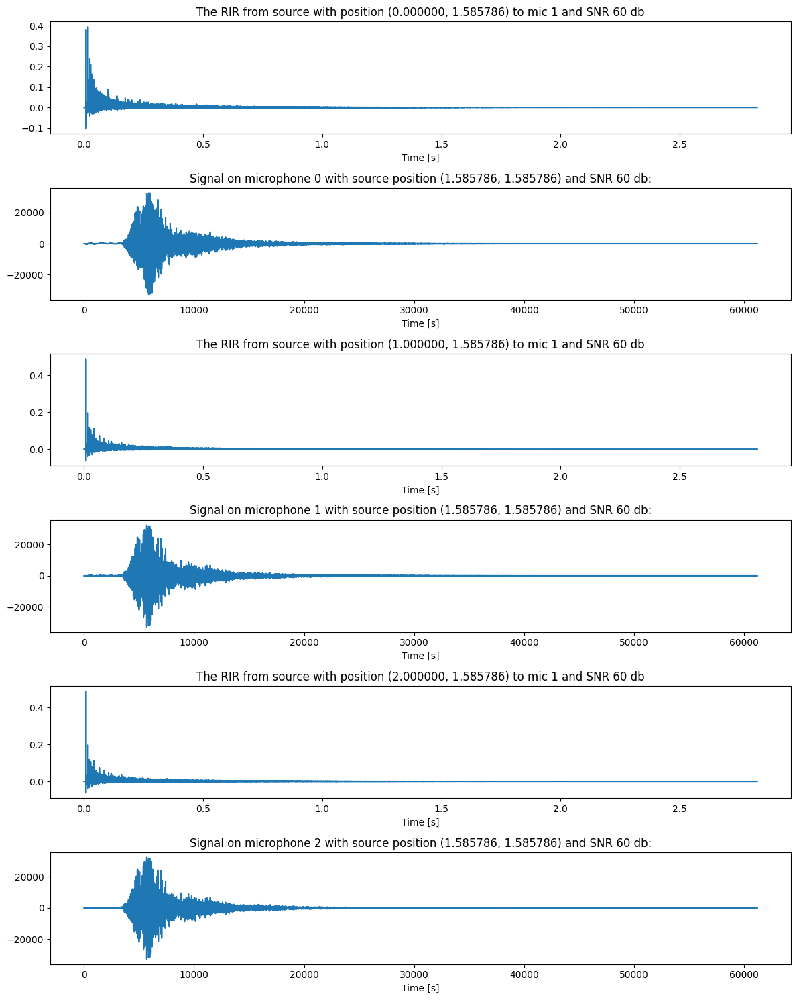

The desired RT60 was 2.0
The measured RT60 is 2.419
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


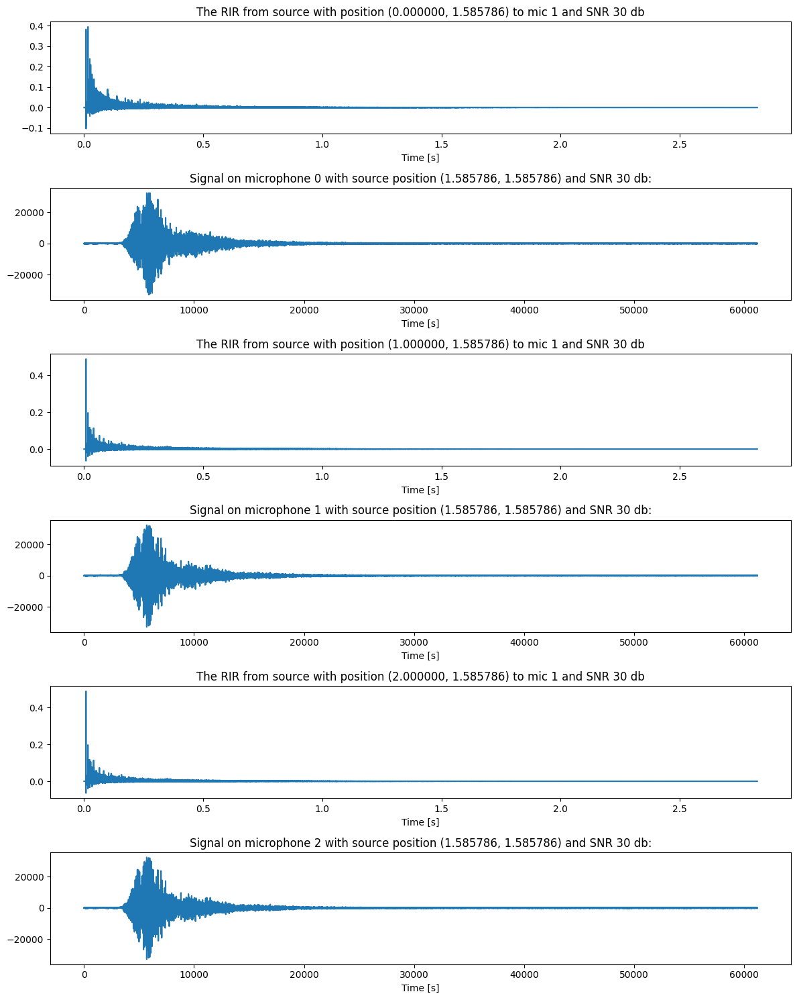

The desired RT60 was 2.0
The measured RT60 is 2.419
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


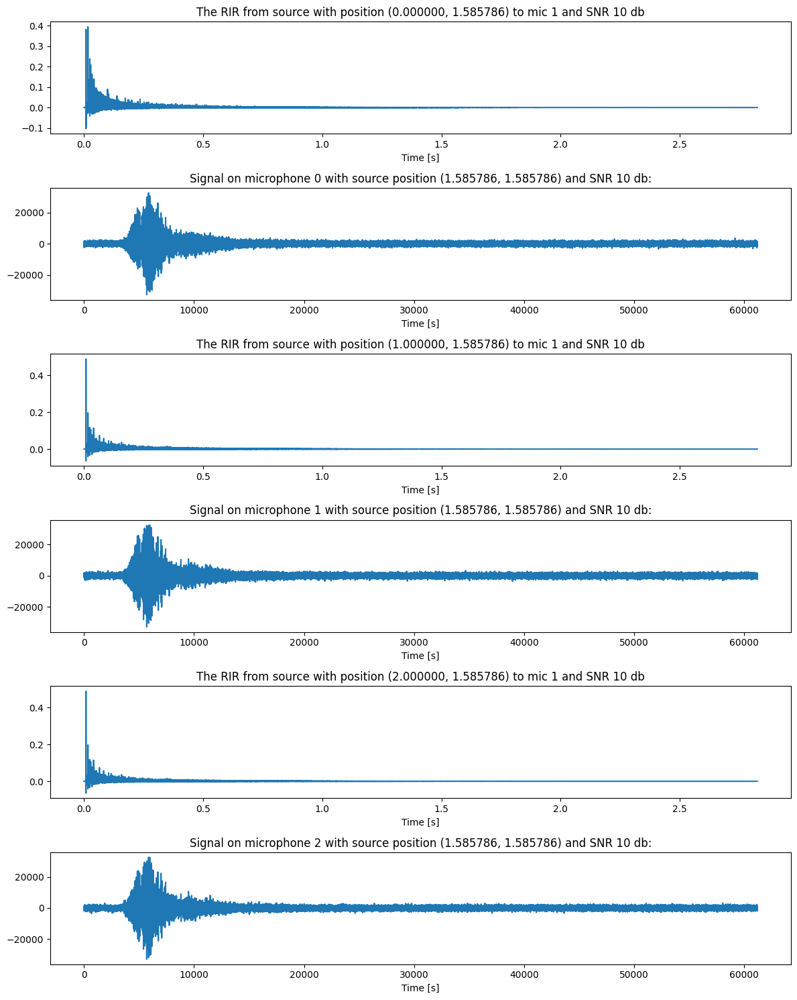

The desired RT60 was 2.0
The measured RT60 is 2.4382499999999996
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


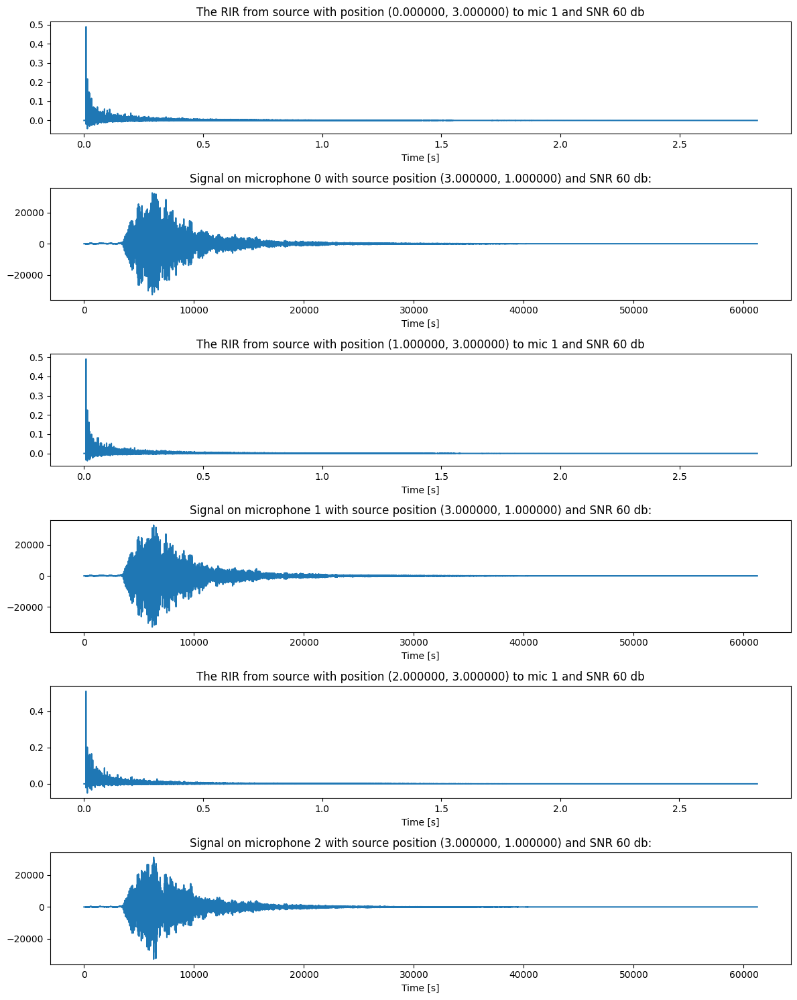

The desired RT60 was 2.0
The measured RT60 is 2.4382499999999996
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


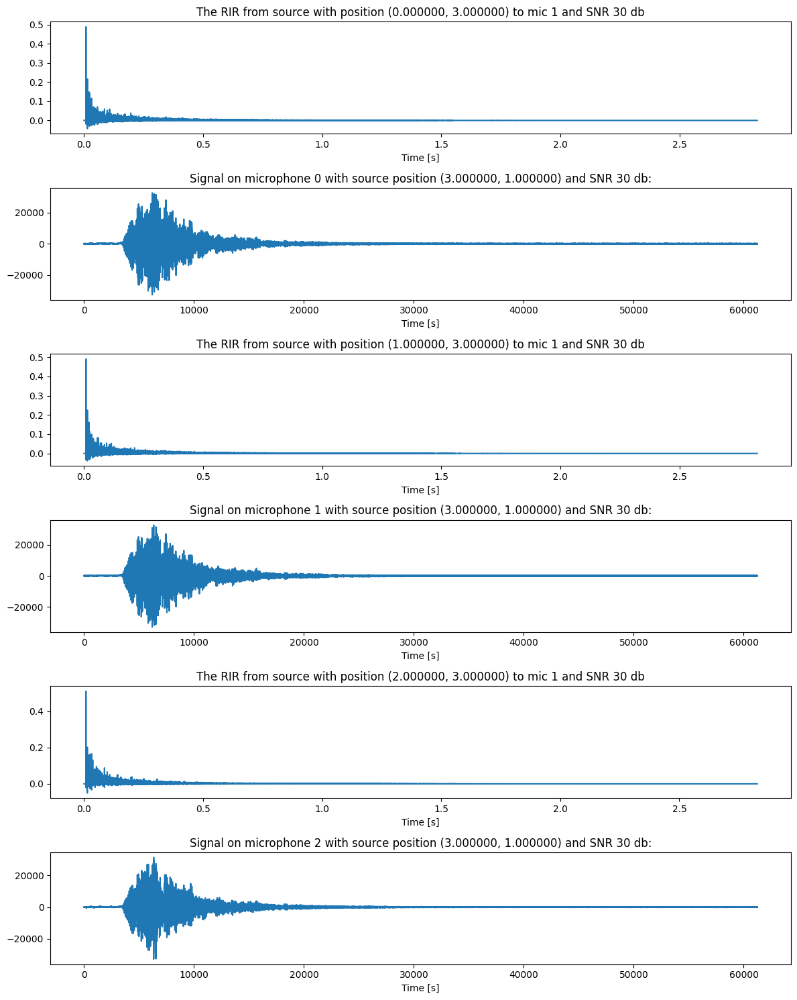

The desired RT60 was 2.0
The measured RT60 is 2.4382499999999996
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


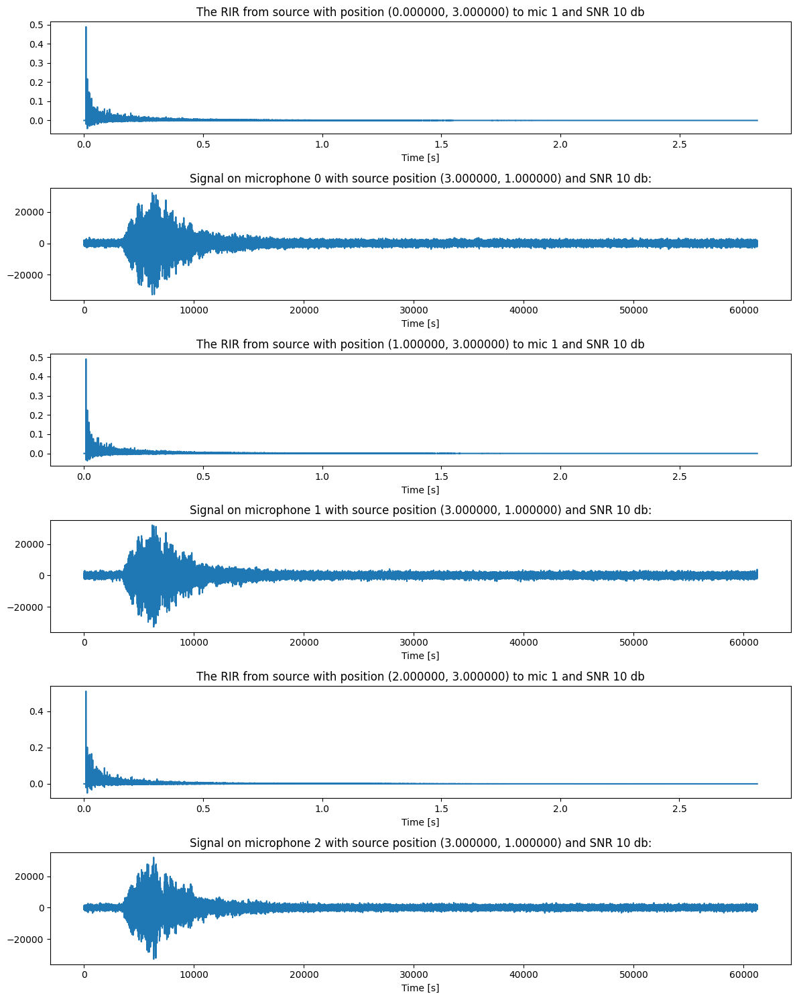

The desired RT60 was 2.0
The measured RT60 is 2.3945625
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


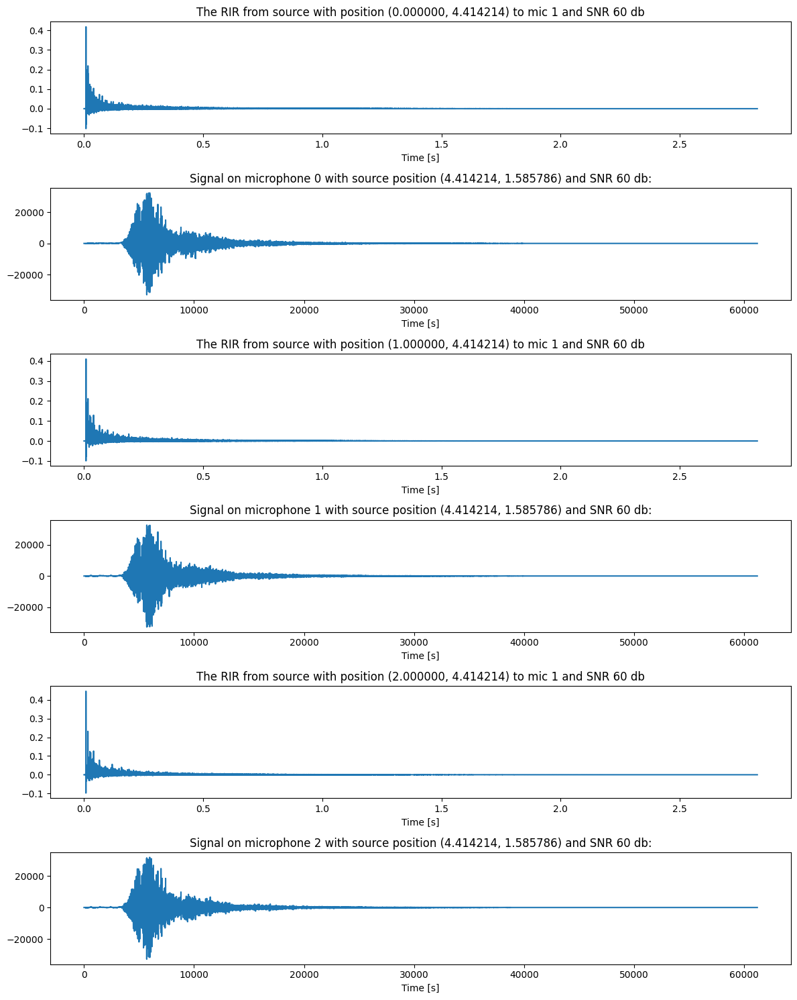

The desired RT60 was 2.0
The measured RT60 is 2.3945625
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


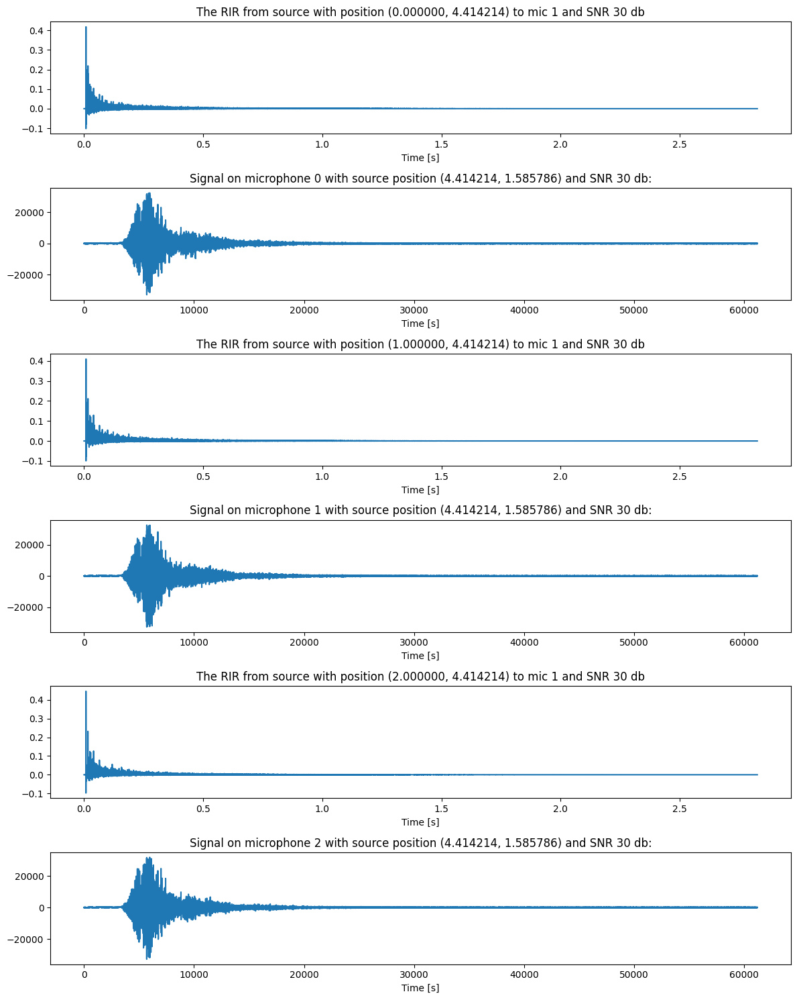

The desired RT60 was 2.0
The measured RT60 is 2.3945625
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


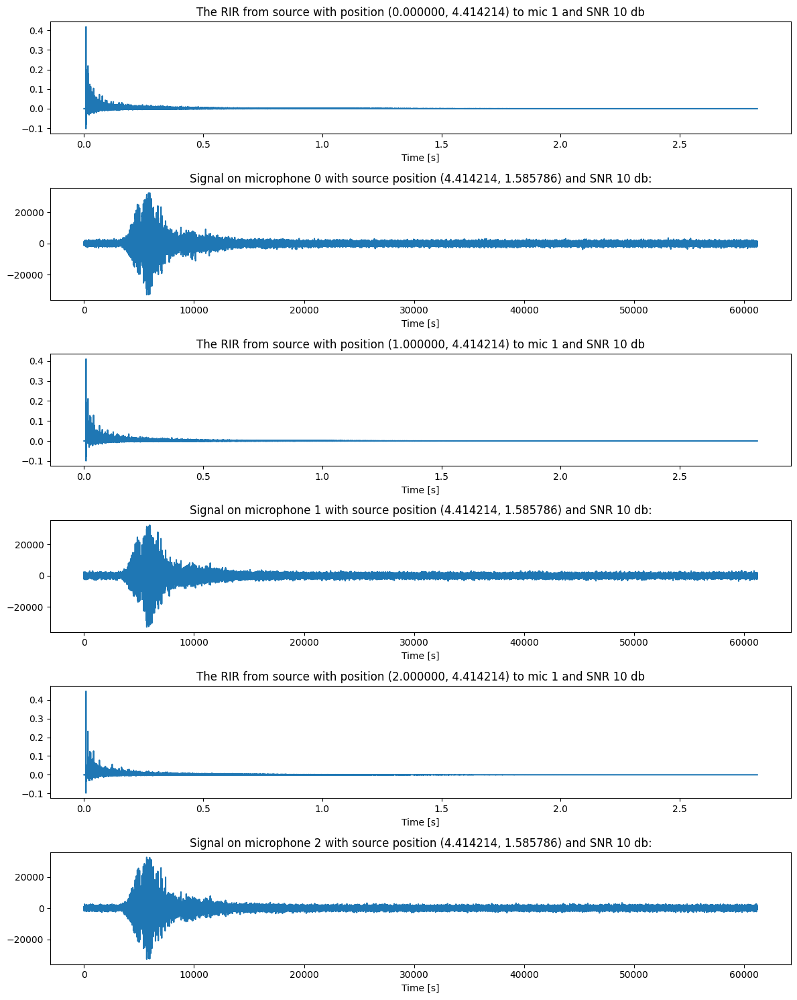

The desired RT60 was 2.0
The measured RT60 is 2.4174375
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


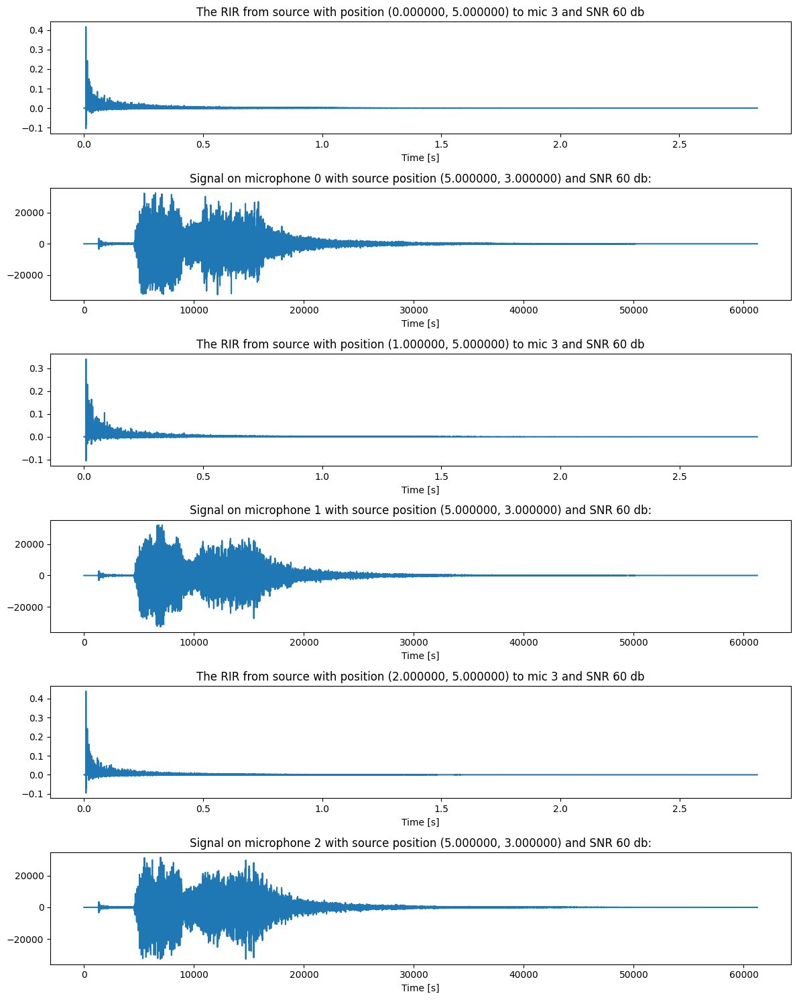

The desired RT60 was 2.0
The measured RT60 is 2.4174375
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


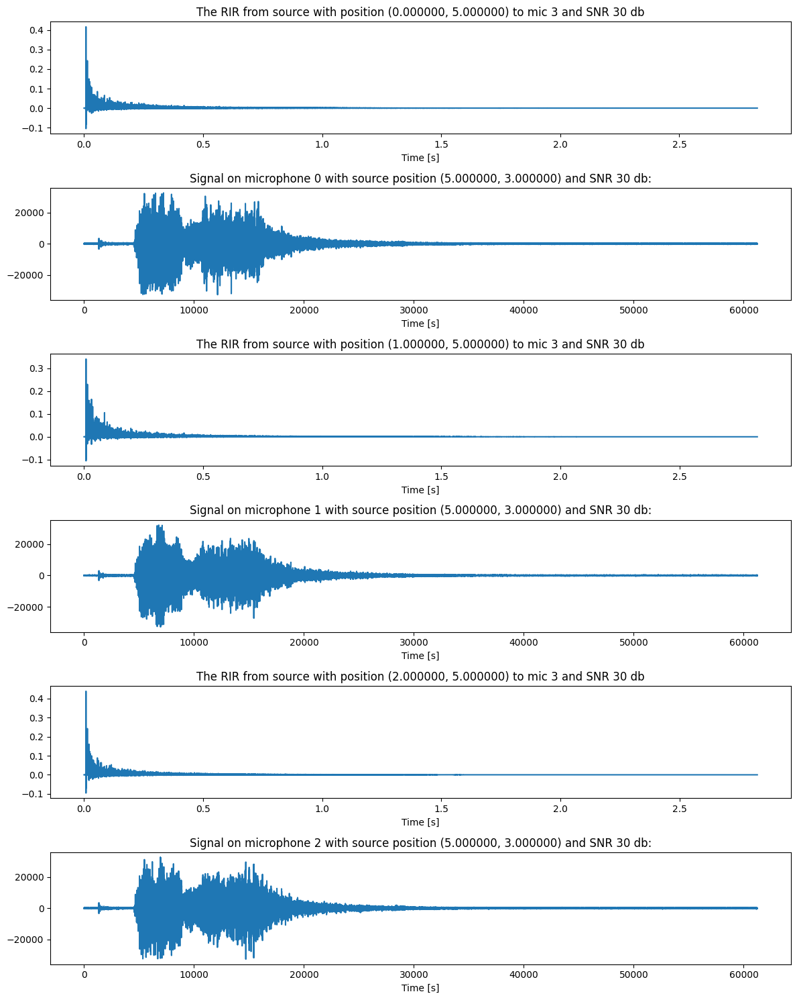

The desired RT60 was 2.0
The measured RT60 is 2.4174375
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


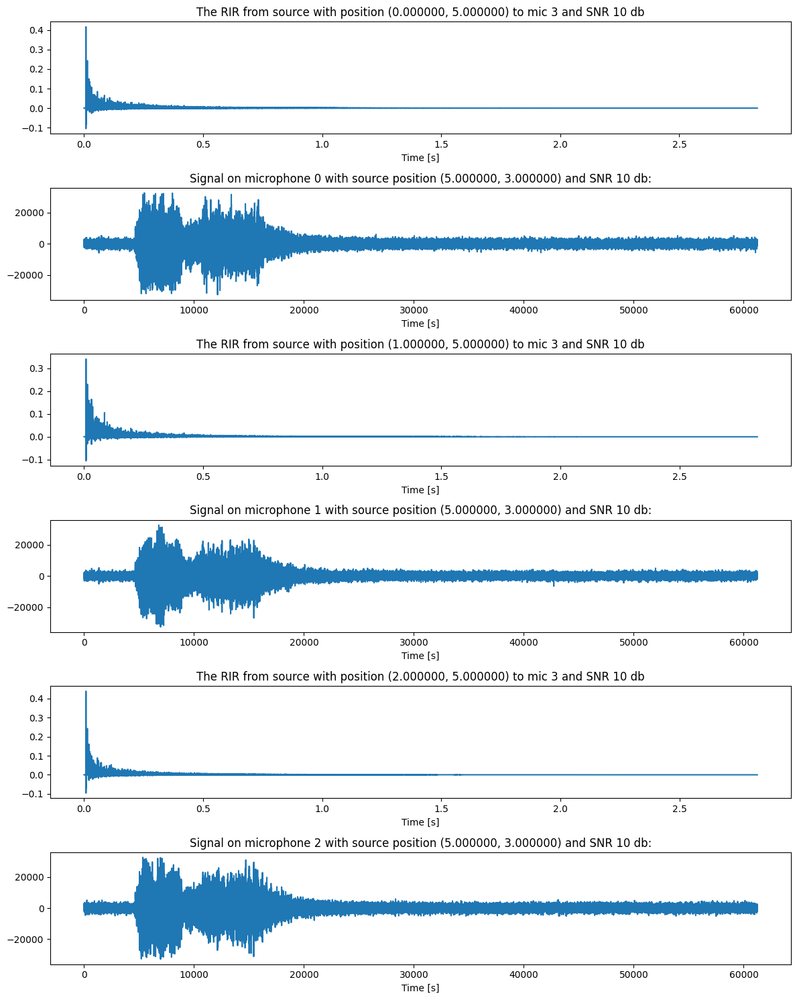

The desired RT60 was 2.0
The measured RT60 is 2.4208125
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


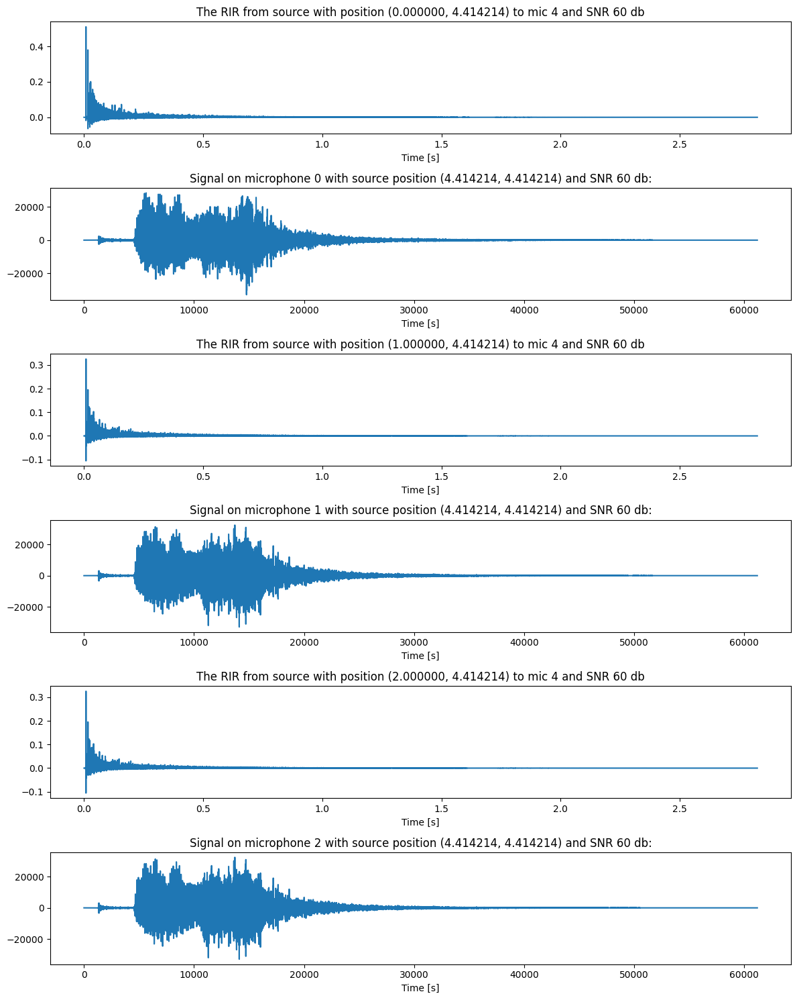

The desired RT60 was 2.0
The measured RT60 is 2.4208125
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


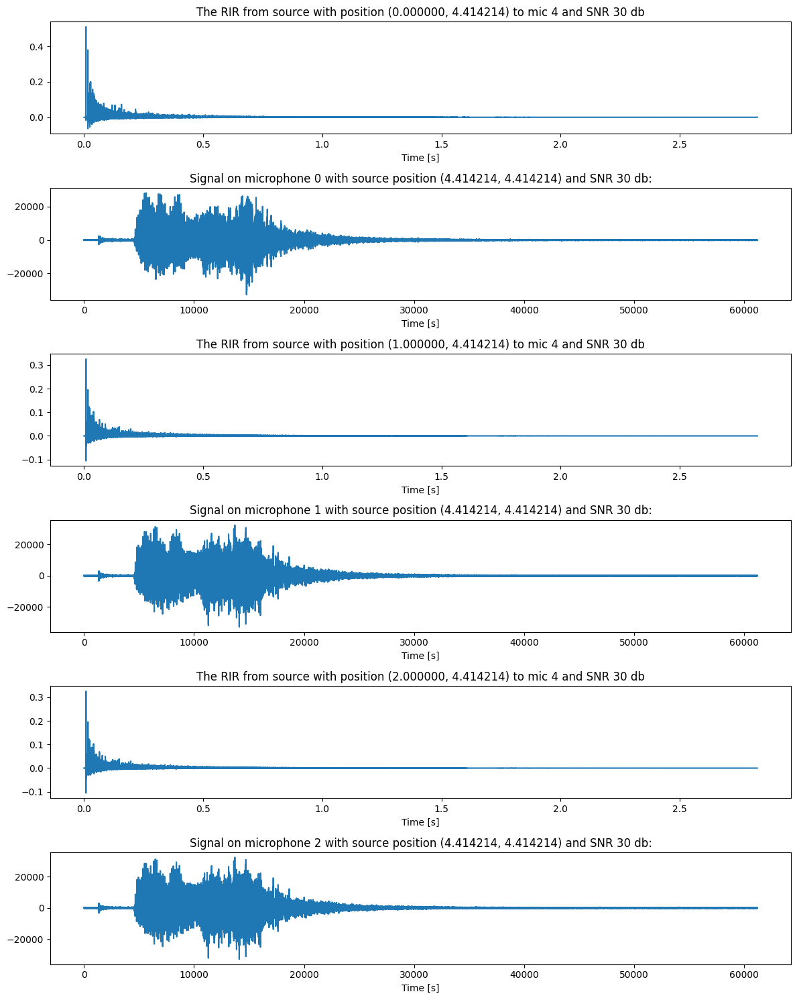

The desired RT60 was 2.0
The measured RT60 is 2.4208125
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


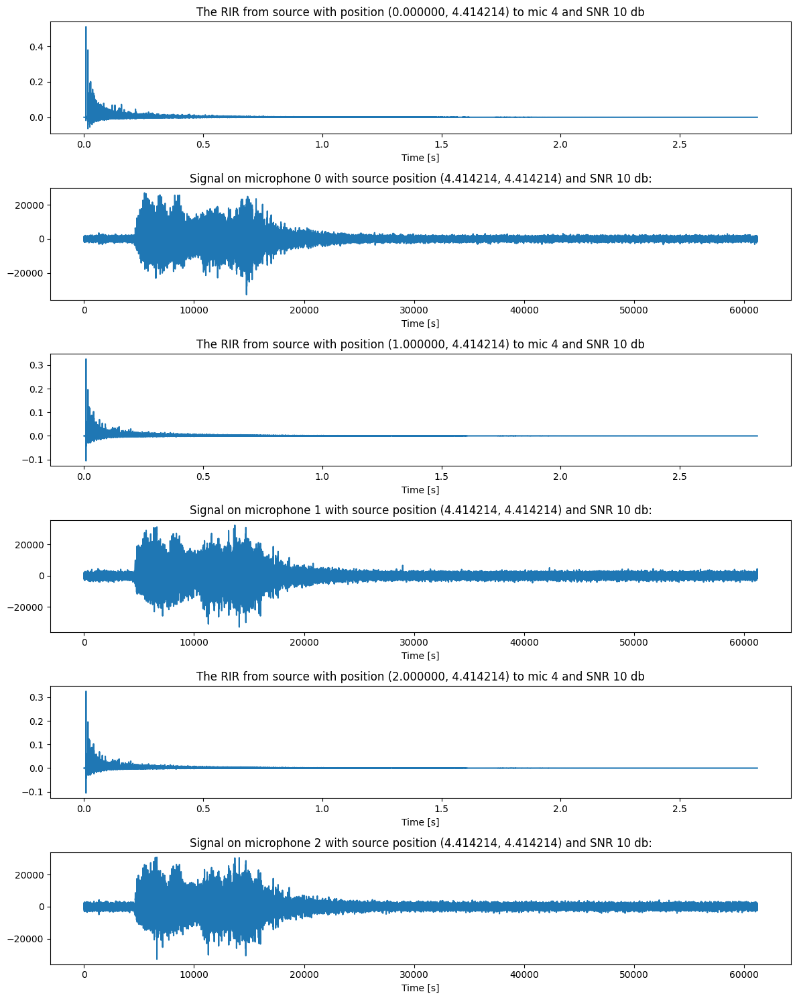

The desired RT60 was 2.0
The measured RT60 is 2.4411875
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


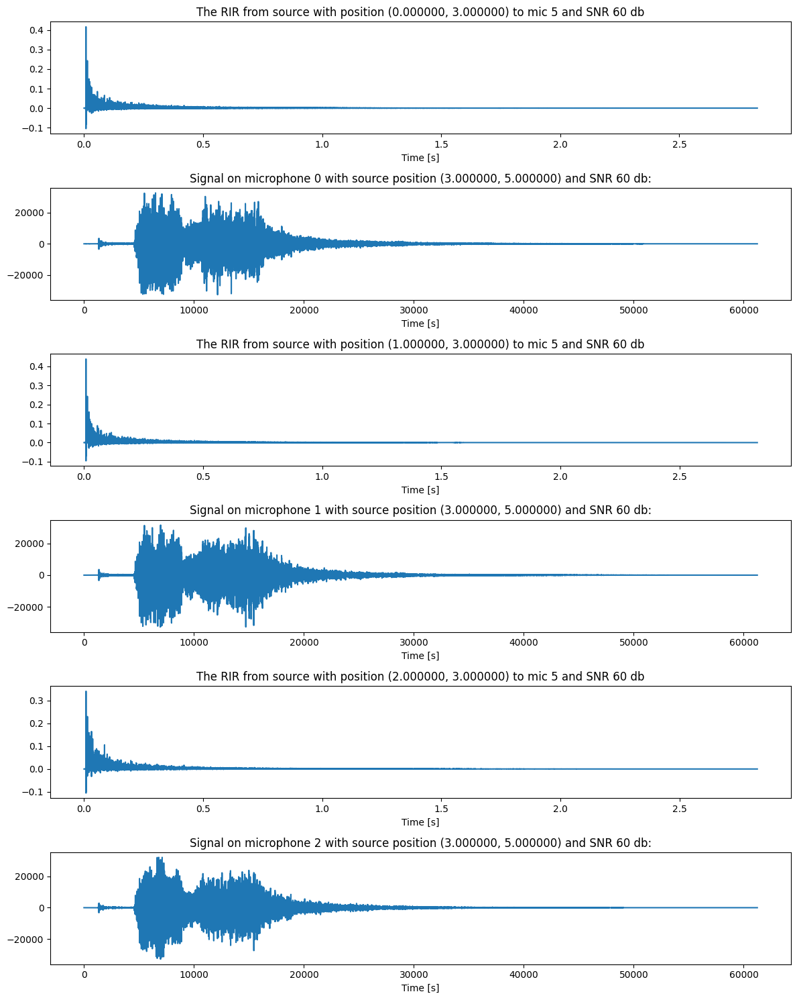

The desired RT60 was 2.0
The measured RT60 is 2.4411875
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


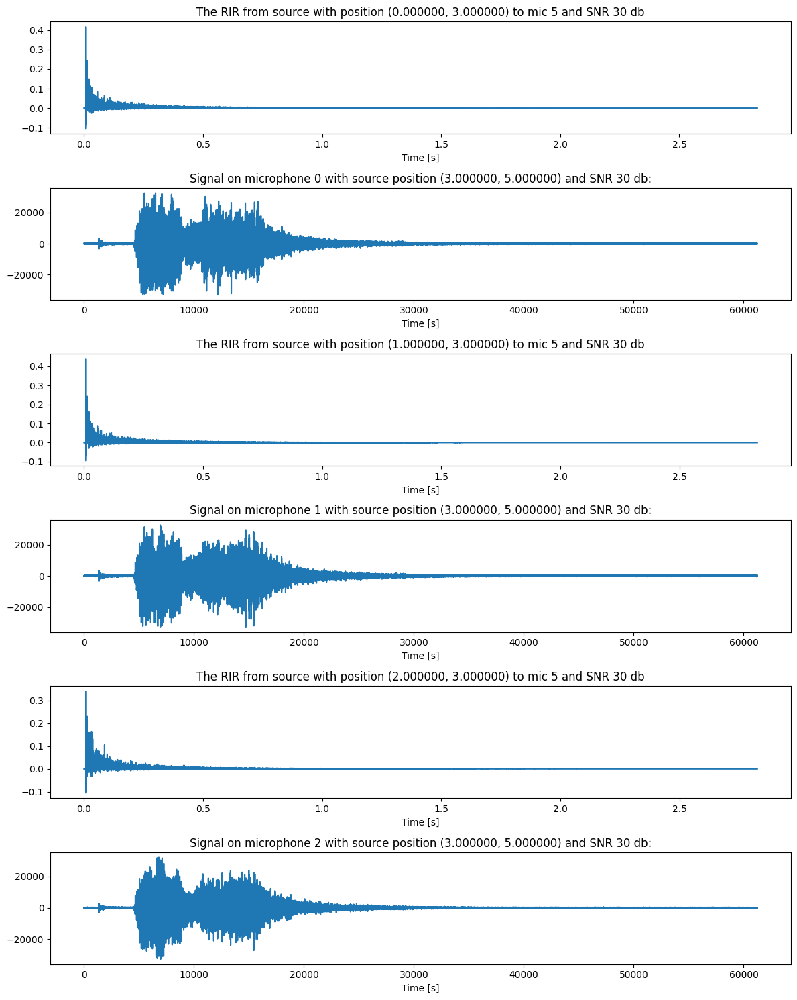

The desired RT60 was 2.0
The measured RT60 is 2.4411875
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


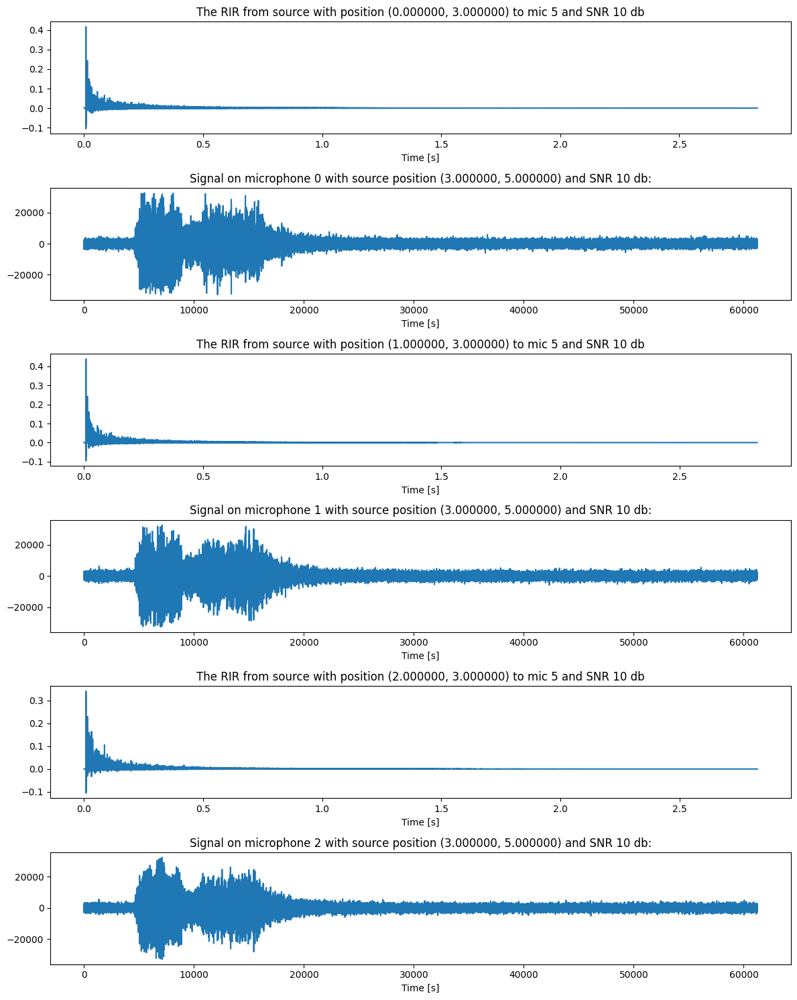

The desired RT60 was 2.0
The measured RT60 is 2.395
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


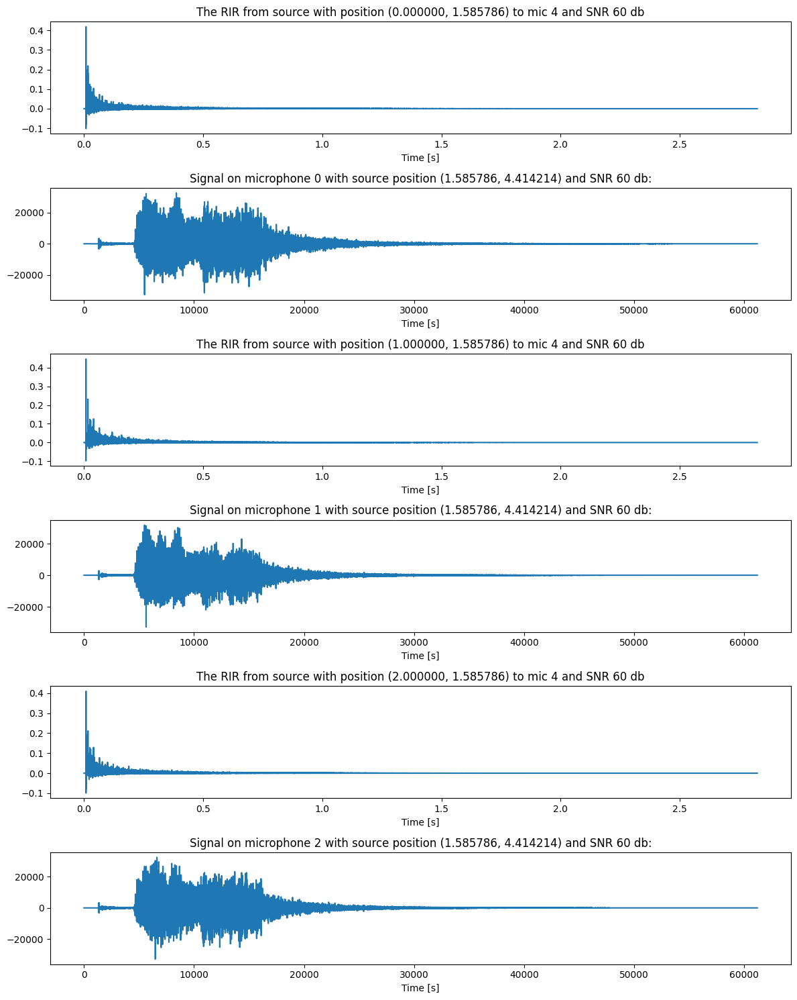

The desired RT60 was 2.0
The measured RT60 is 2.395
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


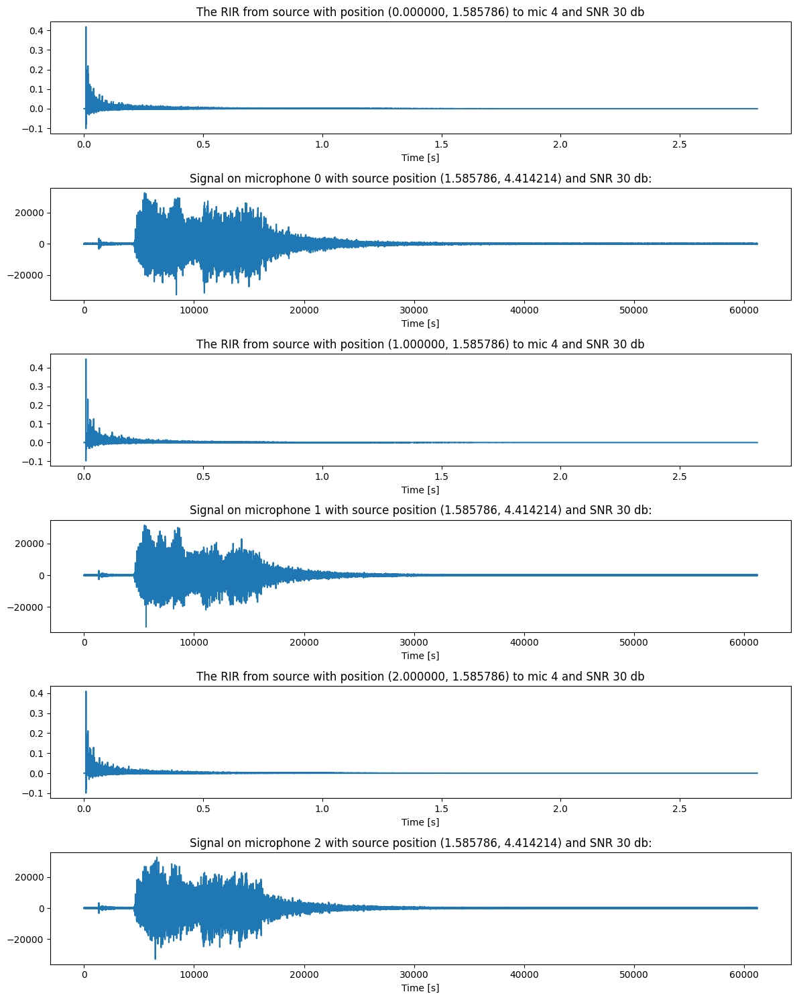

The desired RT60 was 2.0
The measured RT60 is 2.395
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


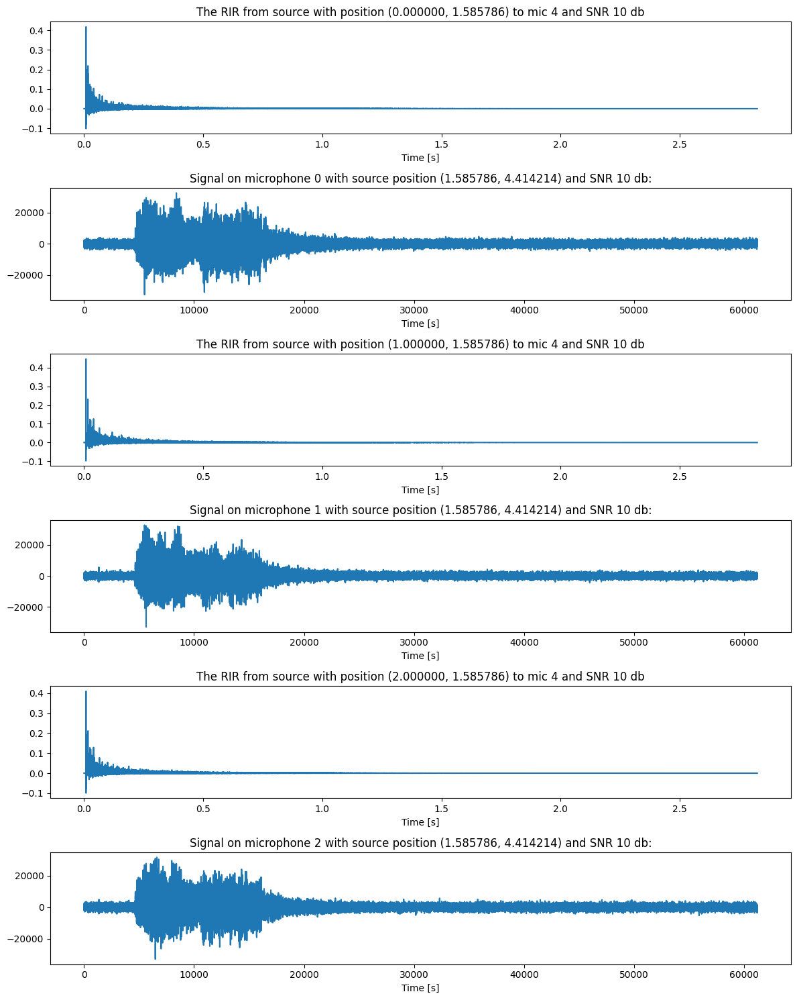

The desired RT60 was 2.0
The measured RT60 is 2.415375
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


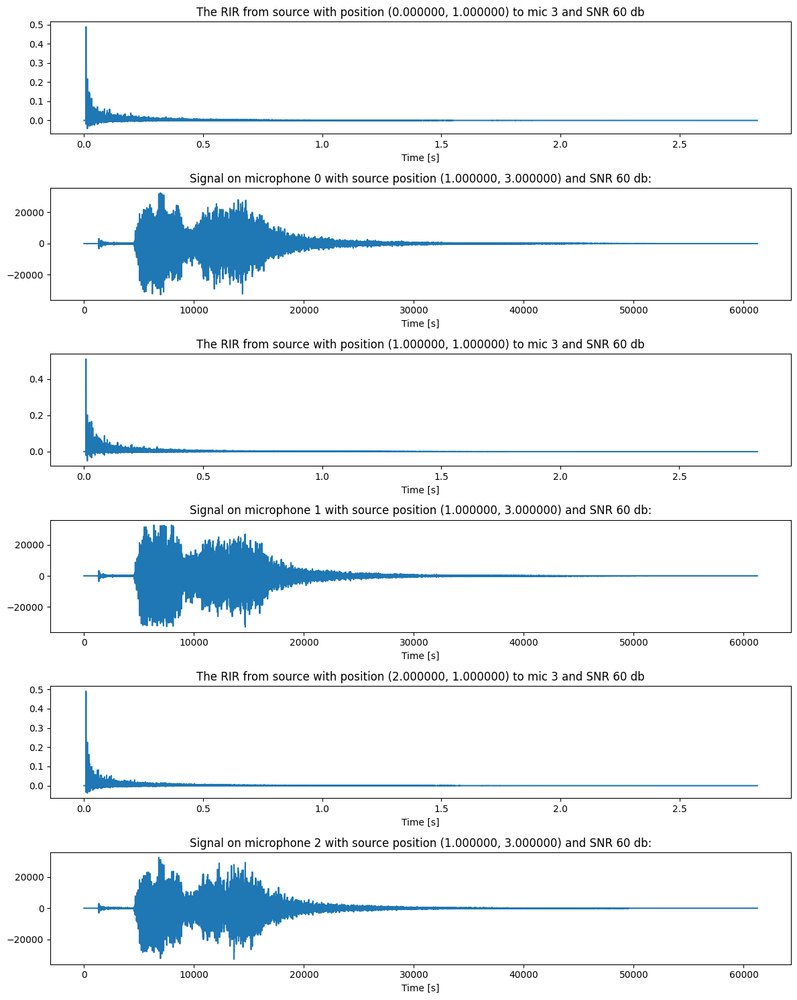

The desired RT60 was 2.0
The measured RT60 is 2.415375
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


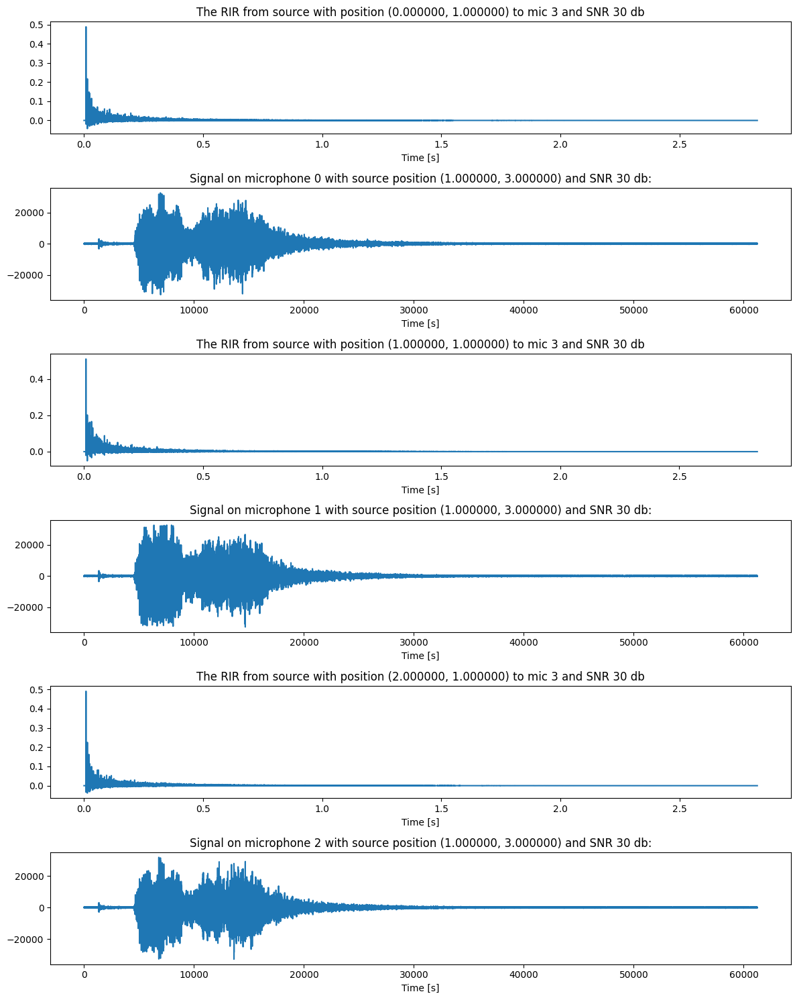

The desired RT60 was 2.0
The measured RT60 is 2.415375
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


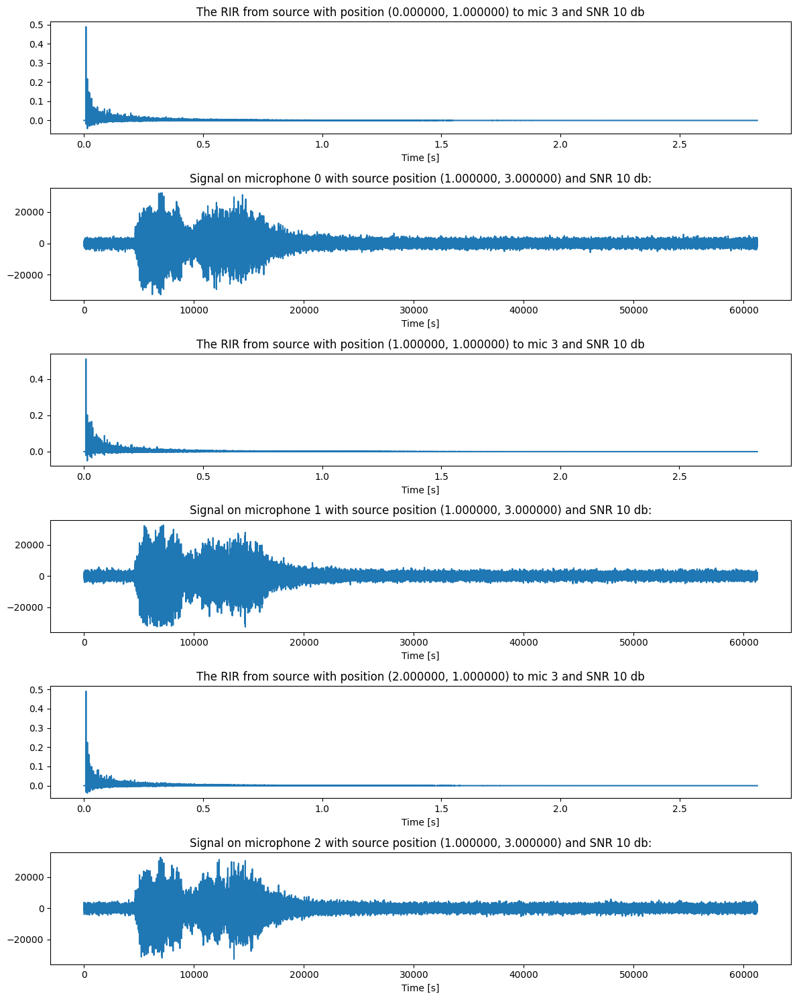

The desired RT60 was 2.0
The measured RT60 is 2.419
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


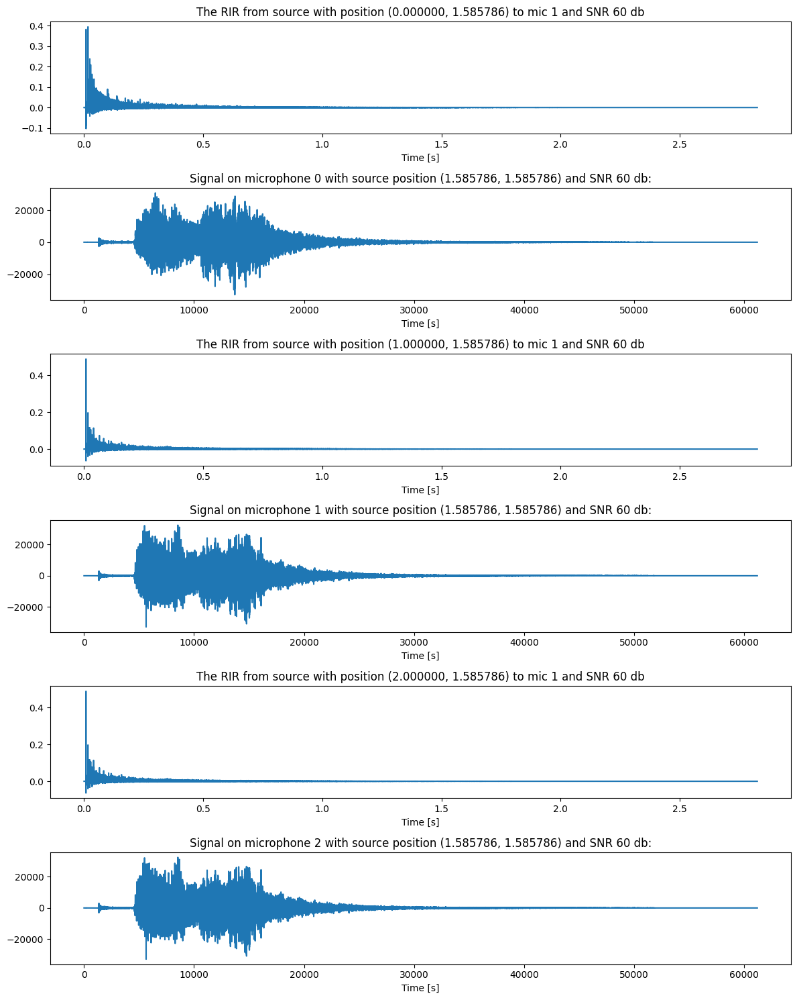

The desired RT60 was 2.0
The measured RT60 is 2.419
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


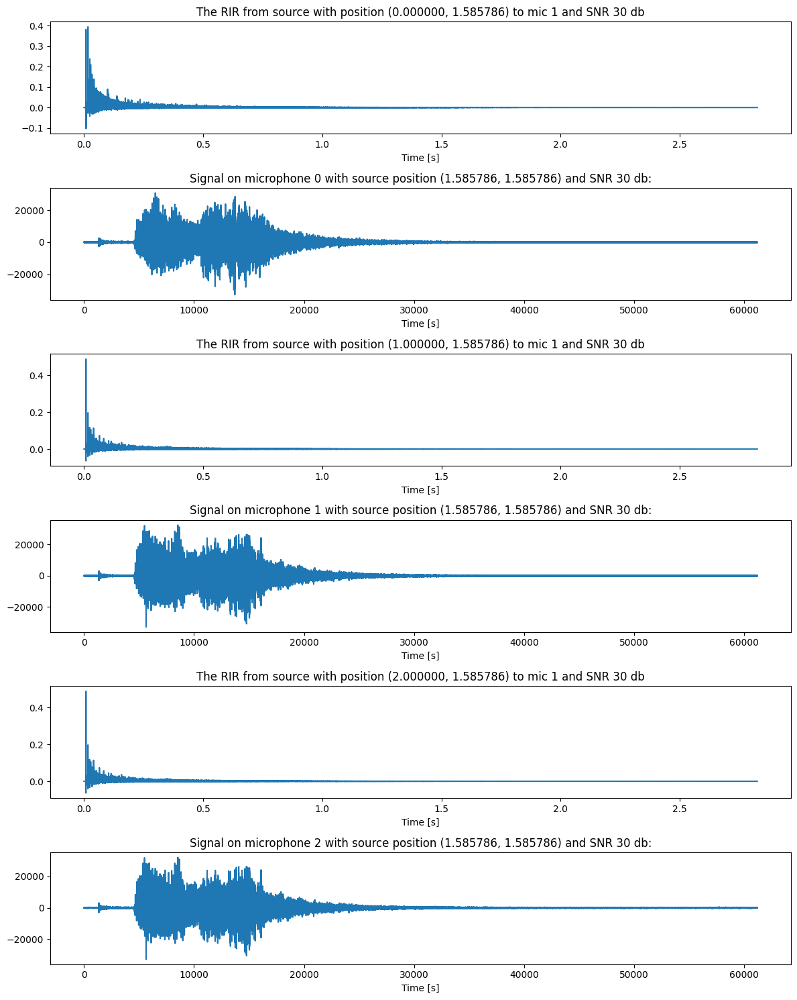

The desired RT60 was 2.0
The measured RT60 is 2.419
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


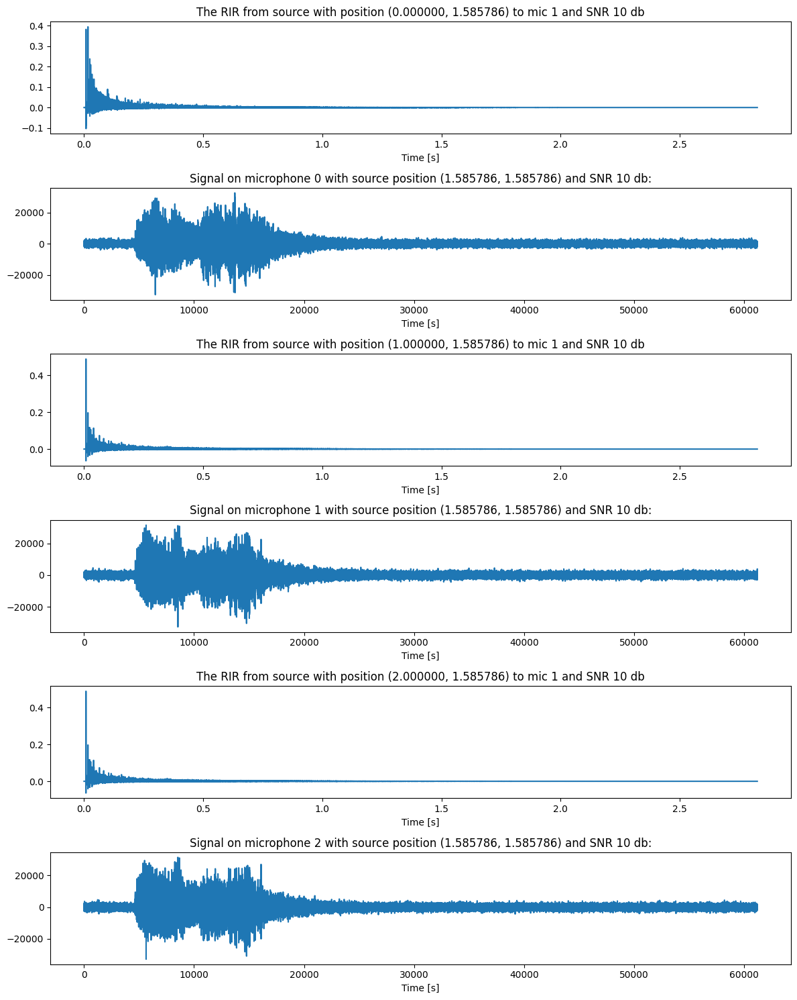

The desired RT60 was 2.0
The measured RT60 is 2.4382499999999996
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


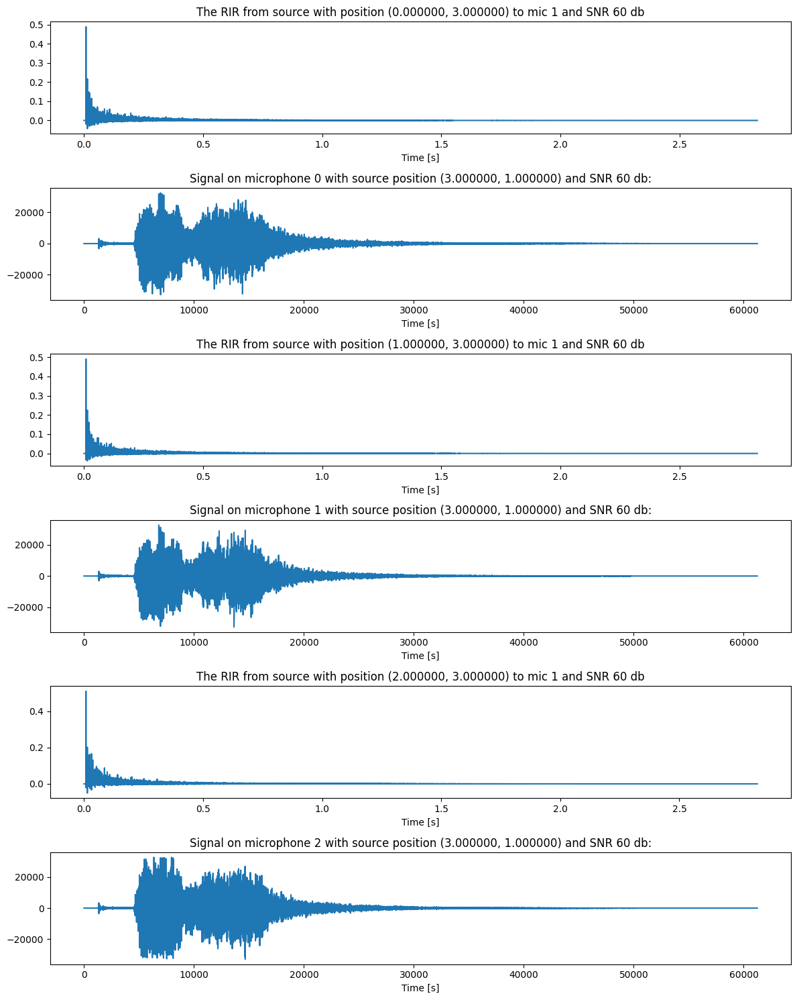

The desired RT60 was 2.0
The measured RT60 is 2.4382499999999996
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


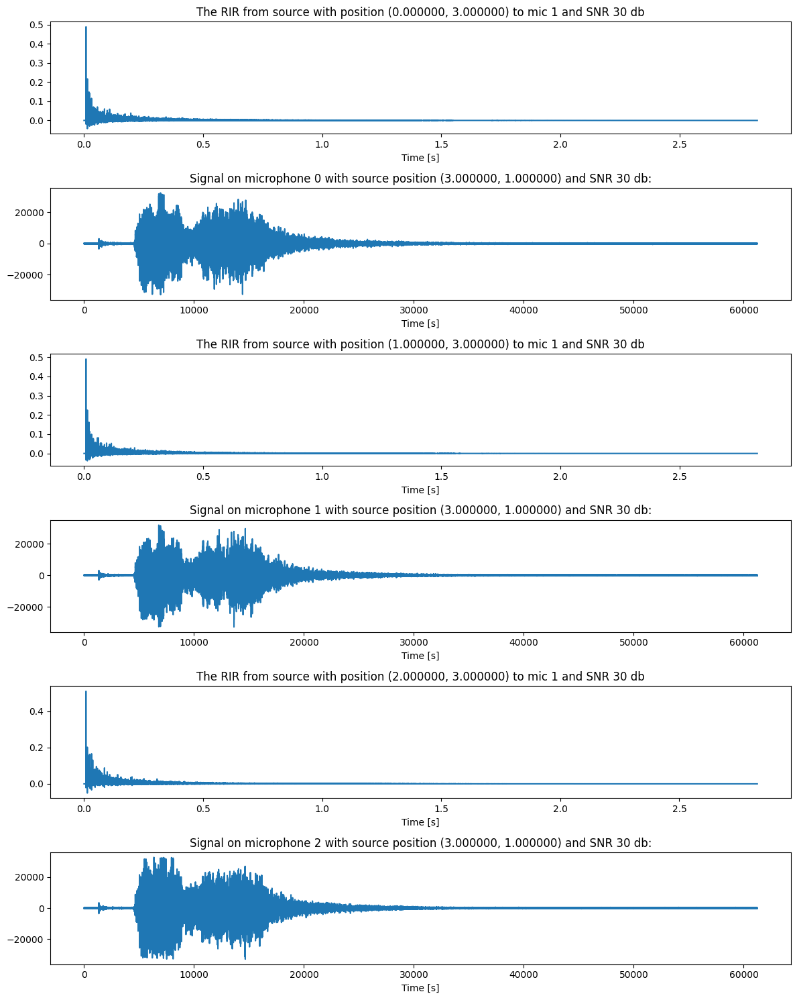

The desired RT60 was 2.0
The measured RT60 is 2.4382499999999996
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


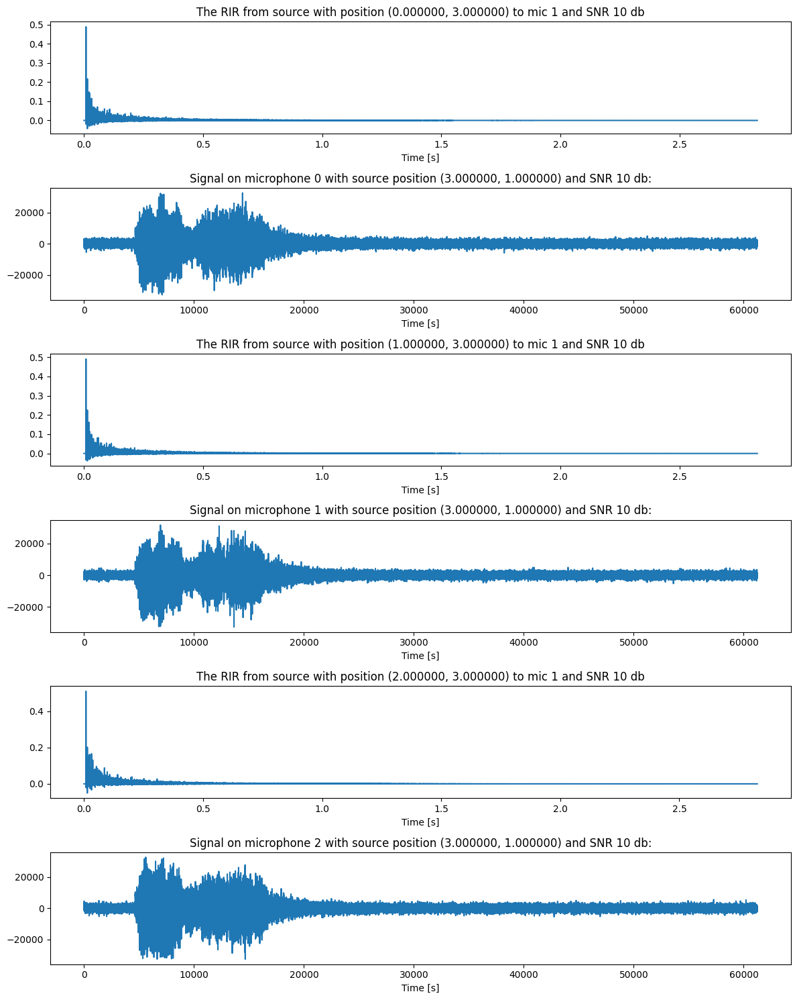

The desired RT60 was 2.0
The measured RT60 is 2.3945625
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


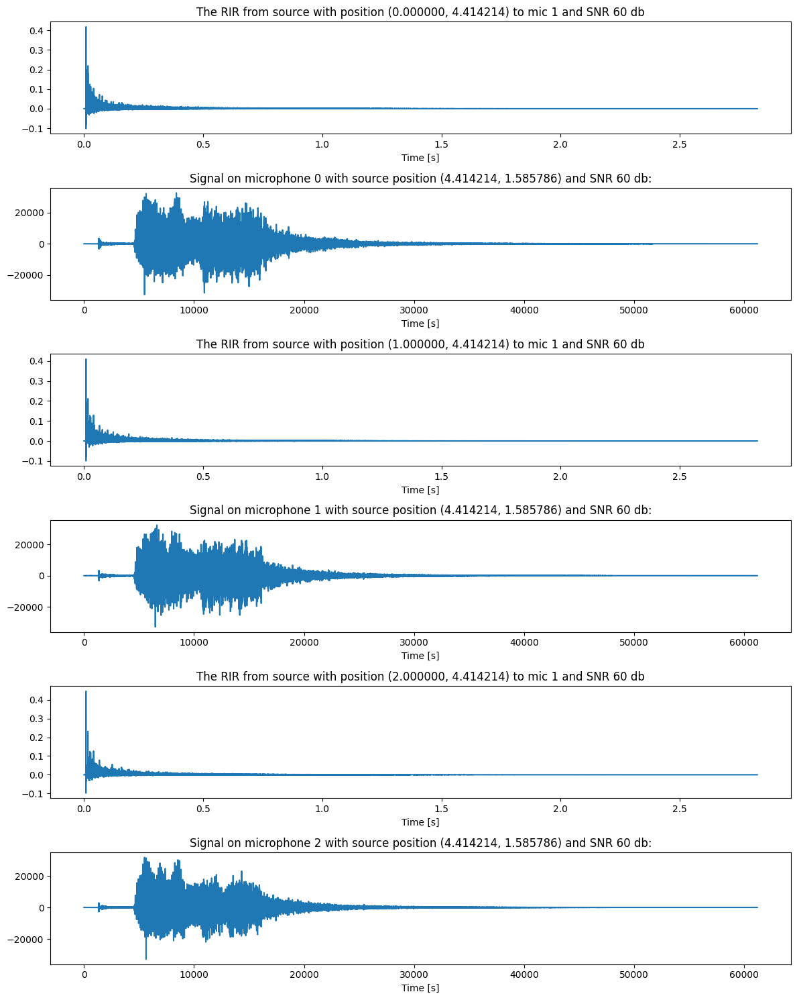

The desired RT60 was 2.0
The measured RT60 is 2.3945625
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


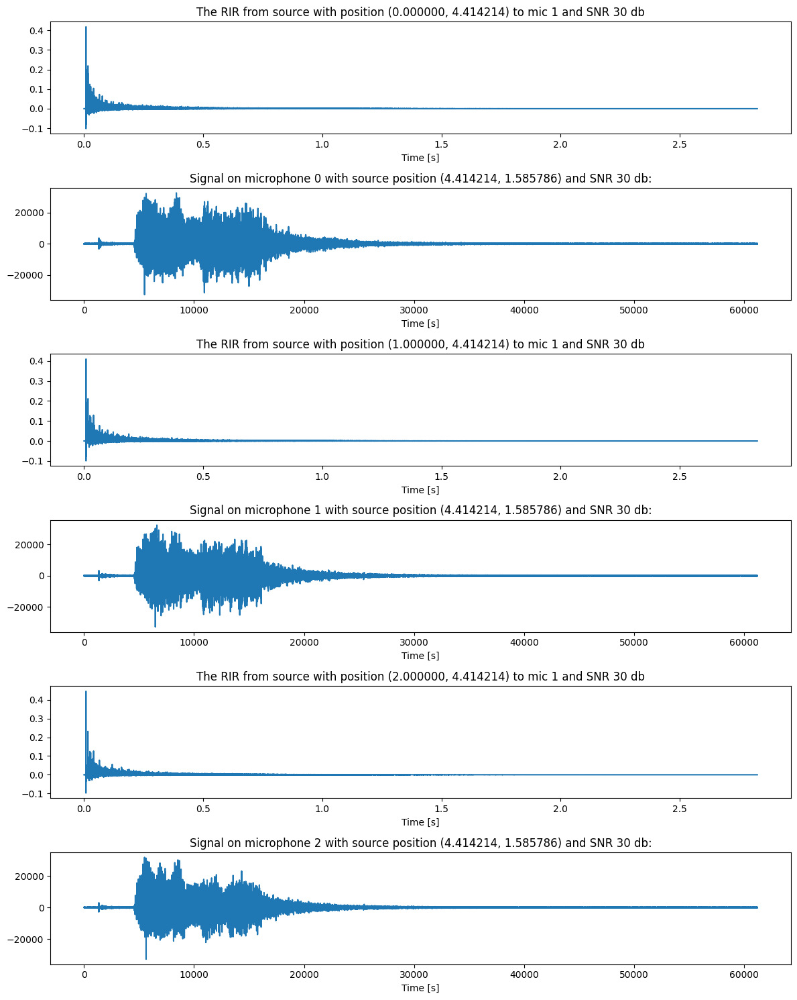

The desired RT60 was 2.0
The measured RT60 is 2.3945625
<class 'numpy.int16'>
<class 'numpy.int16'>
<class 'numpy.int16'>


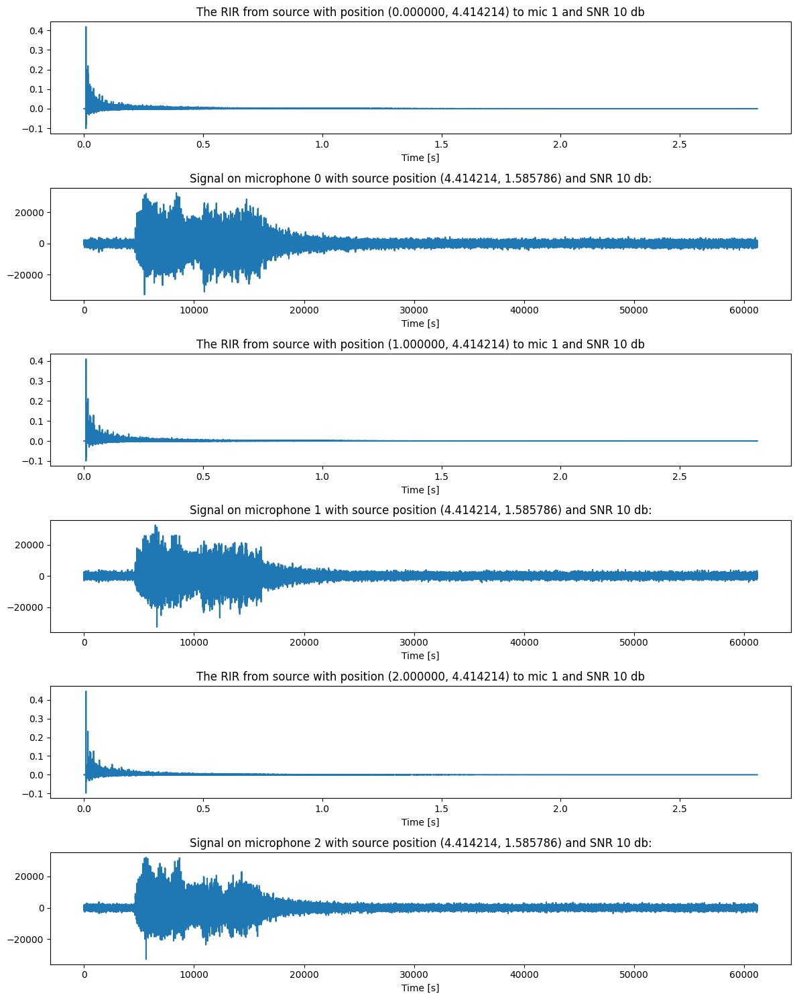

In [26]:
# We invert Sabine's formula to obtain the parameters for the ISM simulator
e_absorption, max_order = pra.inverse_sabine(rt60, room_dim)

for audio_file_name in yes_speech_com_audio_files_pathes[:2]:
  # import a mono wavfile as the source signal
  # the sampling frequency should match that of the room
  audio_signal_fs, audio_signal = wavfile.read(yes_speech_com_audio_files_dir_path + audio_file_name)
  
  for i in range(len(audio_sources_loc_points)):
    audio_source_loc_point = audio_sources_loc_points[i]
    for SNR in SNRs:
    # Create the room
      room = pra.ShoeBox(
          room_dim, fs=audio_signal_fs, materials=pra.Material(e_absorption), max_order=max_order
      )
      # place the source in the room
      # place the microphone array in the room
      room.add_microphone_array(mics_locs)
      room.add_source(audio_source_loc_point.tolist(), signal=audio_signal, delay=0.0)

      # Run the simulation (this will also build the RIR automatically)
      room.simulate(reference_mic=1, snr=SNR)

      # measure the reverberation time
      rt60_sim = room.measure_rt60()
      print("The desired RT60 was {}".format(rt60))
      print("The measured RT60 is {}".format(rt60_sim[1, 0]))

      f = plt.figure()
      f.set_figwidth(12)
      f.set_figheight(15)

      audio_file_hash = get_hash_from_google_command_audio_file_name(audio_file_name)
      os.mkdir(f"{sound_localization_data_set_path}{audio_file_hash}_source_{i}_rt60_{rt60}_SNR_{SNR}")

      for j in range(microphones_num):
        
        # plot RIR for each microphone in microphone array. both can also be plotted using room.plot_rir()`
        rir_1_0 = room.rir[j][0]
        plt.subplot(microphones_num * 2, 1, 2 * j + 1)
        plt.plot(np.arange(len(rir_1_0)) / room.fs, rir_1_0)
        plt.title("The RIR from source with position (%f, %f) to mic %d and SNR %d db" % (j, audio_source_loc_point[0], audio_source_loc_point[1], SNR))
        plt.xlabel("Time [s]")

        #get audio signal for each microphone in microphone array
        #then convert signal from float64 to int16(2**16 quants) and normalize it
        cur_mic_audio_signal = room.mic_array.signals[j, :]
        max_amplitude = np.max(cur_mic_audio_signal)
        cur_mic_audio_signal = (room.mic_array.signals[j, :] / max_amplitude * 2**15).astype(np.int16)

        # plot audio signal for each microphone in microphone array
        plt.subplot(microphones_num * 2, 1, 2 * j + 2)

        plt.plot(cur_mic_audio_signal)
        plt.title("Signal on microphone %d with source position (%f, %f) and SNR %d db:" % (j, audio_source_loc_point[0], audio_source_loc_point[1], SNR))
        plt.xlabel("Time [s]")

        #audio_source_angle, audio_source_distance = get_angle_and_distance_by_2d_point_index(i, audio_sources_angles, audio_sources_distances)

        print(type(cur_mic_audio_signal[0]))

        wavfile.write(f'{sound_localization_data_set_path}{audio_file_hash}_source_{i}_rt60_{rt60}_SNR_{SNR}/{audio_file_hash}_source_{i}_mic_{j}_rt60_{rt60}_SNR_{SNR}.wav', fs, cur_mic_audio_signal)
        #wavfile.read(f'/content/drive/MyDrive/diploma_sound_localization_data/yes_speech_com_mic1_reverb_rt60_{rt60}_SNR_{SNR}db.wav')

        plt.tight_layout()

      plt.show()

